In [1]:
from pathlib import Path
import sys

_here = Path.cwd().resolve()
_candidates = (_here, *_here.parents)
REPO_ROOT = next((candidate for candidate in _candidates if (candidate / "m33_pipeline").is_dir()), None)
if REPO_ROOT is None:
    raise RuntimeError(f"Could not locate repo root from {Path.cwd()}")
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from m33_pipeline.notebook_setup import prepare_notebook

REPO_ROOT = prepare_notebook(REPO_ROOT)
print(f"Notebook working directory set to: {REPO_ROOT}")

Notebook working directory set to: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1


In [2]:
field = 'F6'
max_zoi = 100
flux_method = 'summed_map'
dig_mode = 'no_dig'


In [3]:
# Parameters
field = "NW"
flux_method = "summed_map"
dig_mode = "no_dig"


# 6: With the domains, sum the flux within the region boundaries

In [4]:
from dataclasses import replace

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.io import fits
import os

from m33_pipeline import paths
from m33_pipeline.config import get_photometry_config
from m33_pipeline.io import read_catalog, read_fits_data, read_fits_data_header
from m33_pipeline.photometry import build_field_flux_catalog, load_flux_maps, load_integrated_flux_table, load_region_inputs, write_field_flux_catalog
from m33_pipeline.validate import validate_field_flux_catalog


In [5]:
# Field-level region photometry now lives in m33_pipeline.photometry.
# This notebook keeps the downstream extinction, BPT, and plotting steps.


In [6]:
photometry_config = replace(get_photometry_config(), max_zoi_pc=max_zoi)
merged_df = build_field_flux_catalog(field, max_zoi, photometry_config, method=flux_method, dig_mode=dig_mode)

validation_warnings = validate_field_flux_catalog(merged_df, field)
if validation_warnings:
    print("Validation warnings:")
    for warning in validation_warnings:
        print(f"- {warning}")

# Compatibility variables for downstream notebook cells that still expect the old inline setup.
flux_maps = load_flux_maps(field)
ha_flux_data, ha_flux_err_data = flux_maps["Halpha"]
hb_flux_data, hb_flux_err_data = flux_maps["Hbeta"]
oiii_flux_data, oiii_flux_err_data = flux_maps["[OIII]5007"]
sii6716_flux_data, sii6716_flux_err_data = flux_maps["[SII]6716"]
sii6731_flux_data, sii6731_flux_err_data = flux_maps["[SII]6731"]
nii6584_flux_data, nii6584_flux_err_data = flux_maps["[NII]6583"]
oii3727_flux_data, oii3727_flux_err_data = flux_maps["[OII]3727"]

ha_flux_data, ha_flux_header = read_fits_data_header(paths.calibrated_field_map_dir(field) / f"M33{field}-Haflux.fits")
region_inputs = load_region_inputs(field, max_zoi)
peaks_df = region_inputs["peaks_df"]
zoi_map = region_inputs["zoi_map"]
boundary_map = region_inputs["boundary_map"]
boundary_metric_df = region_inputs["boundary_metrics_df"]
int_flux_df = load_integrated_flux_table(field, len(peaks_df))

print("Built field flux catalog:", merged_df.shape, "method=", flux_method, "dig_mode=", dig_mode)
merged_df.head()


Validation warnings:
- NW flux catalog: duplicate values found in region_id
Built field flux catalog: (1189, 127) method= summed_map dig_mode= no_dig


,region_id,npix_region,npix_dig_annulus,F_Halpha_sum_nodig,F_Halpha_e_sum_nodig,SNR_Halpha_sum_nodig,Halpha_dig_median,Halpha_dig_mad,Halpha_dig_clip_upper,Halpha_dig_npix,...,radius_p16_pc,radius_p50_pc,radius_p84_pc,radius_areaeq_px,radius_areaeq_pc,boundary_method,area_px_after_carve,radius_areaeq_px_after_carve,radius_areaeq_pc_after_carve,flux_method
0,1.0,281.0,263.0,5.358914e-15,8.035589e-17,66.689747,1.811351e-17,6.896300e-18,3.880241e-17,263.0,...,0.000000,13.366773,18.404729,9.457541,12.463628,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,281.0,9.457541,12.463628,summed_map
1,2.0,338.0,553.0,1.395818e-14,8.006960e-17,174.325530,2.879010e-17,7.246236e-18,5.769139e-17,553.0,...,0.000000,7.907105,21.793488,10.372499,13.669407,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,338.0,10.372499,13.669407,summed_map
2,3.0,305.0,575.0,4.288871e-15,6.674213e-17,64.260322,8.161034e-18,3.591259e-18,1.893481e-17,575.0,...,0.000000,14.308095,18.279219,9.853147,12.984979,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,305.0,9.853147,12.984979,summed_map
3,4.0,126.0,5439.0,2.972206e-15,5.602939e-17,53.047262,6.775955e-18,4.944429e-18,2.160924e-17,5439.0,...,3.514269,8.232421,11.945779,6.333012,8.345966,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,126.0,6.333012,8.345966,summed_map
4,5.0,203.0,237.0,2.142295e-15,6.377240e-17,33.592829,9.498875e-18,4.649789e-18,2.344824e-17,237.0,...,5.055142,10.360611,14.684624,8.038464,10.593497,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,203.0,8.038464,10.593497,summed_map


In [7]:
print("Regions with npix_region == 0:", (merged_df["npix_region"] == 0).sum())

for line_name in ["Halpha", "Hbeta", "[OIII]5007", "[SII]6716", "[SII]6731", "[NII]6583", "[OII]3727"]:
    n_nan = merged_df[f"{line_name}_dig_median"].isna().sum()
    print(f"{line_name}: NaN DIG medians = {n_nan}")

for col in merged_df.columns:
    print(col)


Regions with npix_region == 0: 0
Halpha: NaN DIG medians = 4
Hbeta: NaN DIG medians = 4
[OIII]5007: NaN DIG medians = 4
[SII]6716: NaN DIG medians = 4
[SII]6731: NaN DIG medians = 4
[NII]6583: NaN DIG medians = 4
[OII]3727: NaN DIG medians = 4
region_id
npix_region
npix_dig_annulus
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
F_Halpha_sum_digsub
F_Halpha_e_sum_digsub
SNR_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e_sum_nodig
SNR_Hbeta_sum_nodig
Hbeta_dig_median
Hbeta_dig_mad
Hbeta_dig_clip_upper
Hbeta_dig_npix
Hbeta_dig_npix_used
F_Hbeta_sum_digsub
F_Hbeta_e_sum_digsub
SNR_Hbeta_sum_digsub
F_[OIII]5007_sum_nodig
F_[OIII]5007_e_sum_nodig
SNR_[OIII]5007_sum_nodig
[OIII]5007_dig_median
[OIII]5007_dig_mad
[OIII]5007_dig_clip_upper
[OIII]5007_dig_npix
[OIII]5007_dig_npix_used
F_[OIII]5007_sum_digsub
F_[OIII]5007_e_sum_digsub
SNR_[OIII]5007_sum_digsub
F_[SII]6716_sum_nodig
F_[SII]6716

In [8]:
# Put your flux and error maps in a dict for looping
maps = {
    "Halpha":      (ha_flux_data, ha_flux_err_data),
    "Hbeta":      (hb_flux_data, hb_flux_err_data),
    "[OIII]5007":(oiii_flux_data, oiii_flux_err_data),
    "[SII]6716": (sii6716_flux_data, sii6716_flux_err_data),
    "[SII]6731": (sii6731_flux_data, sii6731_flux_err_data),
    "[NII]6583": (nii6584_flux_data, nii6584_flux_err_data),
    "[OII]3727": (oii3727_flux_data, oii3727_flux_err_data),
}

# Region labels present in boundary_map (ignore 0, NaNs)
labels = np.unique(boundary_map[np.isfinite(boundary_map)])
labels = labels[labels > 0].astype(int)

print(f"Found {len(labels)} regions (labels > 0). Min={labels.min() if len(labels) else None}, Max={labels.max() if len(labels) else None}")

Found 1185 regions (labels > 0). Min=1, Max=1189


In [9]:
from tqdm import tqdm
from scipy.ndimage import binary_dilation
def region_edge_ring(region_mask, iterations=1):
    """
    Build an *outer edge ring* just outside the region boundary.

    Exactly:
    - Take region_mask (True inside region)
    - Dilate it by `iterations` pixels
    - Outer ring = dilated_mask & (~region_mask)

    This produces a 1-pixel thick ring outside the region if iterations=1,
    thicker if iterations>1.
    """
    region_mask = np.asarray(region_mask, dtype=bool)
    dil = binary_dilation(region_mask, iterations=iterations)
    ring = dil & (~region_mask)
    return ring

def integrated_flux_and_snr(flux, err, region_mask, ring_mask=None, clip_negative_after_bg=False):
    """
    Compute integrated flux and SNR for a region.

    Definitions used (exact):
    1) Raw integrated flux:
       F_raw = sum_i flux_i  over pixels i inside region_mask

    2) Integrated uncertainty (assuming per-pixel errors are 1-sigma and independent):
       sigma_F = sqrt( sum_i err_i^2 )   over pixels i inside region_mask

    3) Raw SNR:
       SNR_sum = F_raw / sigma_F   (if sigma_F>0 else NaN)

    Background subtraction (if ring_mask provided):
    4) Background level per pixel:
       b = mean_j flux_j over pixels j in ring_mask
       (with NaN-safe mean)

    5) Background-subtracted integrated flux:
       F_bgsub = sum_i (flux_i - b) over region pixels
              = F_raw - b * Npix_region

       Uncertainty remains:
       sigma_F_bgsub = sigma_F
       (i.e., we *do not* add uncertainty from estimating b; if you want that,
        we can include it, but this is the simplest standard approach.)

    6) Background-subtracted SNR:
       SNR_bgsub = F_bgsub / sigma_F  (if sigma_F>0 else NaN)

    Options:
    - clip_negative_after_bg: if True, clip (flux_i - b) at 0 before summing.
      (Default False = physically allows negative after subtraction.)
    """
    flux = np.asarray(flux, dtype=float)
    err  = np.asarray(err, dtype=float)

    inside = region_mask
    f_vals = flux[inside]
    e_vals = err[inside]

    # NaN handling: ignore NaNs in flux; but for error we must also ignore same pixels
    good = np.isfinite(f_vals) & np.isfinite(e_vals)
    f_vals = f_vals[good]
    e_vals = e_vals[good]

    npix = f_vals.size
    if npix == 0:
        return dict(
            npix=0,
            F_raw=np.nan, sigma_F=np.nan, SNR_raw=np.nan,
            b_edge=np.nan, F_bgsub=np.nan, SNR_bgsub=np.nan
        )

    F_raw = np.sum(f_vals)
    sigma_F = np.sqrt(np.sum(e_vals**2))
    SNR_raw = F_raw / sigma_F if sigma_F > 0 else np.nan

    b_edge = np.nan
    F_bgsub = np.nan
    SNR_bgsub = np.nan

    if ring_mask is not None:
        ring_vals = flux[ring_mask]
        ring_vals = ring_vals[np.isfinite(ring_vals)]
        b_edge = np.nanmean(ring_vals) if ring_vals.size > 0 else np.nan

        # background subtract
        if np.isfinite(b_edge):
            if clip_negative_after_bg:
                F_bgsub = np.sum(np.clip(f_vals - b_edge, 0, None))
            else:
                F_bgsub = np.sum(f_vals - b_edge)

            SNR_bgsub = F_bgsub / sigma_F if sigma_F > 0 else np.nan
        else:
            F_bgsub = np.nan
            SNR_bgsub = np.nan

    return dict(
        npix=npix,
        F_raw=F_raw,
        sigma_F=sigma_F,
        SNR_raw=SNR_raw,
        b_edge=b_edge,
        # F_bgsub=F_bgsub,
        # SNR_bgsub=SNR_bgsub
    )

def merge_check_duplicates(left_df, right_df, on, how="left", suffixes=("_x", "_y"), rtol=0, atol=0):
    """
    Merge and resolve duplicate columns:
    - If a column name exists in both (excluding key columns), compare values.
    - If all equal within tolerance -> keep one.
    - If not equal -> keep both with suffixes.

    This expects 'on' to be a list or string key(s).
    """
    if isinstance(on, str):
        on = [on]

    overlap = (set(left_df.columns) & set(right_df.columns)) - set(on)
    merged = left_df.merge(right_df, on=on, how=how, suffixes=suffixes)

    for col in overlap:
        cx = f"{col}{suffixes[0]}"
        cy = f"{col}{suffixes[1]}"
        if cx in merged.columns and cy in merged.columns:
            a = merged[cx].to_numpy()
            b = merged[cy].to_numpy()

            # treat NaNs as equal where both NaN
            both_nan = np.isnan(a) & np.isnan(b) if (np.issubdtype(a.dtype, np.number) and np.issubdtype(b.dtype, np.number)) else np.zeros_like(a, dtype=bool)

            equal = False
            if np.issubdtype(a.dtype, np.number) and np.issubdtype(b.dtype, np.number):
                equal = np.allclose(a[~both_nan], b[~both_nan], rtol=rtol, atol=atol, equal_nan=True)
            else:
                equal = np.all((a == b) | (pd.isna(a) & pd.isna(b)))

            if equal:
                merged[col] = merged[cx]
                merged.drop(columns=[cx, cy], inplace=True)
            else:
                # keep both; do nothing
                pass

    return merged

In [10]:
# Parameters you can tune:
edge_ring_iterations = 1          # thickness of outer ring (pixels)
clip_negative_after_bg = False    # True if you want to force bgsub flux >= 0 per pixel

rows = []

for rid in tqdm(labels, desc="Processing regions"):
    region_mask = (boundary_map == rid)
    ring_mask = region_edge_ring(region_mask, iterations=edge_ring_iterations)

    row = {
        "region_id": rid,
        "npix_region": int(np.sum(region_mask)),
        "npix_edge_ring": int(np.sum(ring_mask)),
    }

    # # optional: store a region-wide average ZoI value (or something else)
    # if 'zoi_map' in globals() and zoi_map is not None:
    #     zvals = zoi_map[region_mask]
    #     zvals = zvals[np.isfinite(zvals)]
    #     row["zoi_mean"] = float(np.nanmean(zvals)) if zvals.size else np.nan
    #     row["zoi_median"] = float(np.nanmedian(zvals)) if zvals.size else np.nan
    # else:
    #     row["zoi_mean"] = np.nan
    #     row["zoi_median"] = np.nan

    for name, (flux, err) in maps.items():
        stats = integrated_flux_and_snr(
            flux=flux,
            err=err,
            region_mask=region_mask,
            ring_mask=ring_mask,
            clip_negative_after_bg=clip_negative_after_bg
        )

        # Write columns in a consistent naming scheme
        row[f"F_{name}_sum"]     = stats["F_raw"]
        row[f"F_{name}_e_sum"]   = stats["sigma_F"]
        row[f"SNR_{name}_sum"]   = stats["SNR_raw"]
        row[f"{name}_b_edge"]    = stats["b_edge"]
        # row[f"{name}_F_bgsub"]   = stats["F_bgsub"]
        # row[f"{name}_SNR_bgsub"] = stats["SNR_bgsub"]

    rows.append(row)

flux_catalog_df = pd.DataFrame(rows).sort_values("region_id").reset_index(drop=True)

flux_catalog_df.head()

Processing regions:   0%|                                                                                                                     | 0/1185 [00:00<?, ?it/s]

Processing regions:   0%|▏                                                                                                            | 2/1185 [00:00<01:20, 14.77it/s]

Processing regions:   0%|▎                                                                                                            | 4/1185 [00:00<01:11, 16.53it/s]

Processing regions:   1%|▌                                                                                                            | 6/1185 [00:00<01:09, 16.91it/s]

Processing regions:   1%|▋                                                                                                            | 8/1185 [00:00<01:08, 17.19it/s]

Processing regions:   1%|▉                                                                                                           | 10/1185 [00:00<01:07, 17.37it/s]

Processing regions:   1%|█                                                                                                           | 12/1185 [00:00<01:06, 17.59it/s]

Processing regions:   1%|█▎                                                                                                          | 14/1185 [00:00<01:06, 17.74it/s]

Processing regions:   1%|█▍                                                                                                          | 16/1185 [00:00<01:05, 17.88it/s]

Processing regions:   2%|█▋                                                                                                          | 18/1185 [00:01<01:04, 18.02it/s]

Processing regions:   2%|█▊                                                                                                          | 20/1185 [00:01<01:05, 17.71it/s]

Processing regions:   2%|██                                                                                                          | 22/1185 [00:01<01:06, 17.61it/s]

Processing regions:   2%|██▏                                                                                                         | 24/1185 [00:01<01:05, 17.66it/s]

Processing regions:   2%|██▎                                                                                                         | 26/1185 [00:01<01:06, 17.34it/s]

Processing regions:   2%|██▌                                                                                                         | 28/1185 [00:01<01:07, 17.22it/s]

Processing regions:   3%|██▋                                                                                                         | 30/1185 [00:01<01:06, 17.34it/s]

Processing regions:   3%|██▉                                                                                                         | 32/1185 [00:01<01:05, 17.51it/s]

Processing regions:   3%|███                                                                                                         | 34/1185 [00:01<01:05, 17.63it/s]

Processing regions:   3%|███▎                                                                                                        | 36/1185 [00:02<01:05, 17.53it/s]

Processing regions:   3%|███▍                                                                                                        | 38/1185 [00:02<01:04, 17.73it/s]

Processing regions:   3%|███▋                                                                                                        | 40/1185 [00:02<01:04, 17.78it/s]

Processing regions:   4%|███▊                                                                                                        | 42/1185 [00:02<01:04, 17.84it/s]

Processing regions:   4%|████                                                                                                        | 44/1185 [00:02<01:03, 17.86it/s]

Processing regions:   4%|████▏                                                                                                       | 46/1185 [00:02<01:04, 17.78it/s]

Processing regions:   4%|████▎                                                                                                       | 48/1185 [00:02<01:04, 17.55it/s]

Processing regions:   4%|████▌                                                                                                       | 50/1185 [00:02<01:05, 17.38it/s]

Processing regions:   4%|████▋                                                                                                       | 52/1185 [00:02<01:04, 17.60it/s]

Processing regions:   5%|████▉                                                                                                       | 54/1185 [00:03<01:04, 17.60it/s]

Processing regions:   5%|█████                                                                                                       | 56/1185 [00:03<01:04, 17.64it/s]

Processing regions:   5%|█████▎                                                                                                      | 58/1185 [00:03<01:03, 17.74it/s]

Processing regions:   5%|█████▍                                                                                                      | 60/1185 [00:03<01:02, 17.90it/s]

Processing regions:   5%|█████▋                                                                                                      | 62/1185 [00:03<01:02, 17.99it/s]

Processing regions:   5%|█████▊                                                                                                      | 64/1185 [00:03<01:03, 17.55it/s]

Processing regions:   6%|██████                                                                                                      | 66/1185 [00:03<01:03, 17.70it/s]

Processing regions:   6%|██████▏                                                                                                     | 68/1185 [00:03<01:02, 17.75it/s]

Processing regions:   6%|██████▍                                                                                                     | 70/1185 [00:03<01:02, 17.84it/s]

Processing regions:   6%|██████▌                                                                                                     | 72/1185 [00:04<01:02, 17.86it/s]

Processing regions:   6%|██████▋                                                                                                     | 74/1185 [00:04<01:01, 17.97it/s]

Processing regions:   6%|██████▉                                                                                                     | 76/1185 [00:04<01:01, 17.99it/s]

Processing regions:   7%|███████                                                                                                     | 78/1185 [00:04<01:01, 17.92it/s]

Processing regions:   7%|███████▎                                                                                                    | 80/1185 [00:04<01:01, 17.98it/s]

Processing regions:   7%|███████▍                                                                                                    | 82/1185 [00:04<01:01, 17.85it/s]

Processing regions:   7%|███████▋                                                                                                    | 84/1185 [00:04<01:01, 17.95it/s]

Processing regions:   7%|███████▊                                                                                                    | 86/1185 [00:04<01:00, 18.05it/s]

Processing regions:   7%|████████                                                                                                    | 88/1185 [00:04<01:00, 18.16it/s]

Processing regions:   8%|████████▏                                                                                                   | 90/1185 [00:05<01:00, 18.13it/s]

Processing regions:   8%|████████▍                                                                                                   | 92/1185 [00:05<01:00, 18.16it/s]

Processing regions:   8%|████████▌                                                                                                   | 94/1185 [00:05<01:00, 18.16it/s]

Processing regions:   8%|████████▋                                                                                                   | 96/1185 [00:05<01:00, 18.08it/s]

Processing regions:   8%|████████▉                                                                                                   | 98/1185 [00:05<00:59, 18.12it/s]

Processing regions:   8%|█████████                                                                                                  | 100/1185 [00:05<01:00, 17.97it/s]

Processing regions:   9%|█████████▏                                                                                                 | 102/1185 [00:05<01:00, 17.87it/s]

Processing regions:   9%|█████████▍                                                                                                 | 104/1185 [00:05<01:00, 17.84it/s]

Processing regions:   9%|█████████▌                                                                                                 | 106/1185 [00:05<00:59, 17.98it/s]

Processing regions:   9%|█████████▊                                                                                                 | 108/1185 [00:06<00:59, 18.00it/s]

Processing regions:   9%|█████████▉                                                                                                 | 110/1185 [00:06<00:59, 18.02it/s]

Processing regions:   9%|██████████                                                                                                 | 112/1185 [00:06<00:59, 18.09it/s]

Processing regions:  10%|██████████▎                                                                                                | 114/1185 [00:06<00:58, 18.17it/s]

Processing regions:  10%|██████████▍                                                                                                | 116/1185 [00:06<00:58, 18.16it/s]

Processing regions:  10%|██████████▋                                                                                                | 118/1185 [00:06<00:59, 17.95it/s]

Processing regions:  10%|██████████▊                                                                                                | 120/1185 [00:06<00:59, 18.00it/s]

Processing regions:  10%|███████████                                                                                                | 122/1185 [00:06<00:59, 17.99it/s]

Processing regions:  10%|███████████▏                                                                                               | 124/1185 [00:06<00:58, 18.07it/s]

Processing regions:  11%|███████████▍                                                                                               | 126/1185 [00:07<00:59, 17.93it/s]

Processing regions:  11%|███████████▌                                                                                               | 128/1185 [00:07<00:58, 17.98it/s]

Processing regions:  11%|███████████▋                                                                                               | 130/1185 [00:07<00:58, 18.06it/s]

Processing regions:  11%|███████████▉                                                                                               | 132/1185 [00:07<00:58, 18.13it/s]

Processing regions:  11%|████████████                                                                                               | 134/1185 [00:07<00:57, 18.20it/s]

Processing regions:  11%|████████████▎                                                                                              | 136/1185 [00:07<00:58, 18.02it/s]

Processing regions:  12%|████████████▍                                                                                              | 138/1185 [00:07<00:58, 18.01it/s]

Processing regions:  12%|████████████▋                                                                                              | 140/1185 [00:07<00:58, 17.95it/s]

Processing regions:  12%|████████████▊                                                                                              | 142/1185 [00:07<00:57, 18.02it/s]

Processing regions:  12%|█████████████                                                                                              | 144/1185 [00:08<00:58, 17.79it/s]

Processing regions:  12%|█████████████▏                                                                                             | 146/1185 [00:08<00:59, 17.52it/s]

Processing regions:  12%|█████████████▎                                                                                             | 148/1185 [00:08<00:58, 17.66it/s]

Processing regions:  13%|█████████████▌                                                                                             | 150/1185 [00:08<00:58, 17.75it/s]

Processing regions:  13%|█████████████▋                                                                                             | 152/1185 [00:08<00:58, 17.81it/s]

Processing regions:  13%|█████████████▉                                                                                             | 154/1185 [00:08<00:59, 17.43it/s]

Processing regions:  13%|██████████████                                                                                             | 156/1185 [00:08<00:58, 17.48it/s]

Processing regions:  13%|██████████████▎                                                                                            | 158/1185 [00:08<00:58, 17.68it/s]

Processing regions:  14%|██████████████▍                                                                                            | 160/1185 [00:08<00:57, 17.84it/s]

Processing regions:  14%|██████████████▋                                                                                            | 162/1185 [00:09<00:57, 17.89it/s]

Processing regions:  14%|██████████████▊                                                                                            | 164/1185 [00:09<00:57, 17.82it/s]

Processing regions:  14%|██████████████▉                                                                                            | 166/1185 [00:09<00:56, 17.89it/s]

Processing regions:  14%|███████████████▏                                                                                           | 168/1185 [00:09<00:56, 17.96it/s]

Processing regions:  14%|███████████████▎                                                                                           | 170/1185 [00:09<00:56, 18.02it/s]

Processing regions:  15%|███████████████▌                                                                                           | 172/1185 [00:09<00:56, 17.79it/s]

Processing regions:  15%|███████████████▋                                                                                           | 174/1185 [00:09<00:56, 17.85it/s]

Processing regions:  15%|███████████████▉                                                                                           | 176/1185 [00:09<00:57, 17.61it/s]

Processing regions:  15%|████████████████                                                                                           | 178/1185 [00:10<00:56, 17.82it/s]

Processing regions:  15%|████████████████▎                                                                                          | 180/1185 [00:10<00:56, 17.84it/s]

Processing regions:  15%|████████████████▍                                                                                          | 182/1185 [00:10<00:55, 17.97it/s]

Processing regions:  16%|████████████████▌                                                                                          | 184/1185 [00:10<00:55, 18.01it/s]

Processing regions:  16%|████████████████▊                                                                                          | 186/1185 [00:10<00:55, 18.09it/s]

Processing regions:  16%|████████████████▉                                                                                          | 188/1185 [00:10<00:55, 18.02it/s]

Processing regions:  16%|█████████████████▏                                                                                         | 190/1185 [00:10<00:55, 17.99it/s]

Processing regions:  16%|█████████████████▎                                                                                         | 192/1185 [00:10<00:55, 17.98it/s]

Processing regions:  16%|█████████████████▌                                                                                         | 194/1185 [00:10<00:54, 18.05it/s]

Processing regions:  17%|█████████████████▋                                                                                         | 196/1185 [00:10<00:54, 18.00it/s]

Processing regions:  17%|█████████████████▉                                                                                         | 198/1185 [00:11<00:54, 18.00it/s]

Processing regions:  17%|██████████████████                                                                                         | 200/1185 [00:11<00:54, 17.92it/s]

Processing regions:  17%|██████████████████▏                                                                                        | 202/1185 [00:11<00:54, 18.04it/s]

Processing regions:  17%|██████████████████▍                                                                                        | 204/1185 [00:11<00:54, 18.10it/s]

Processing regions:  17%|██████████████████▌                                                                                        | 206/1185 [00:11<00:53, 18.17it/s]

Processing regions:  18%|██████████████████▊                                                                                        | 208/1185 [00:11<00:54, 18.07it/s]

Processing regions:  18%|██████████████████▉                                                                                        | 210/1185 [00:11<00:53, 18.13it/s]

Processing regions:  18%|███████████████████▏                                                                                       | 212/1185 [00:11<00:54, 18.00it/s]

Processing regions:  18%|███████████████████▎                                                                                       | 214/1185 [00:11<00:54, 17.86it/s]

Processing regions:  18%|███████████████████▌                                                                                       | 216/1185 [00:12<00:53, 17.99it/s]

Processing regions:  18%|███████████████████▋                                                                                       | 218/1185 [00:12<00:53, 17.91it/s]

Processing regions:  19%|███████████████████▊                                                                                       | 220/1185 [00:12<00:53, 18.02it/s]

Processing regions:  19%|████████████████████                                                                                       | 222/1185 [00:12<00:53, 17.95it/s]

Processing regions:  19%|████████████████████▏                                                                                      | 224/1185 [00:12<00:53, 18.05it/s]

Processing regions:  19%|████████████████████▍                                                                                      | 226/1185 [00:12<00:53, 17.96it/s]

Processing regions:  19%|████████████████████▌                                                                                      | 228/1185 [00:12<00:53, 18.05it/s]

Processing regions:  19%|████████████████████▊                                                                                      | 230/1185 [00:12<00:53, 17.95it/s]

Processing regions:  20%|████████████████████▉                                                                                      | 232/1185 [00:12<00:52, 18.01it/s]

Processing regions:  20%|█████████████████████▏                                                                                     | 234/1185 [00:13<00:53, 17.79it/s]

Processing regions:  20%|█████████████████████▎                                                                                     | 236/1185 [00:13<00:54, 17.56it/s]

Processing regions:  20%|█████████████████████▍                                                                                     | 238/1185 [00:13<00:53, 17.75it/s]

Processing regions:  20%|█████████████████████▋                                                                                     | 240/1185 [00:13<00:52, 17.86it/s]

Processing regions:  20%|█████████████████████▊                                                                                     | 242/1185 [00:13<00:52, 17.87it/s]

Processing regions:  21%|██████████████████████                                                                                     | 244/1185 [00:13<00:52, 17.94it/s]

Processing regions:  21%|██████████████████████▏                                                                                    | 246/1185 [00:13<00:52, 18.02it/s]

Processing regions:  21%|██████████████████████▍                                                                                    | 248/1185 [00:13<00:52, 18.01it/s]

Processing regions:  21%|██████████████████████▌                                                                                    | 250/1185 [00:14<00:51, 18.04it/s]

Processing regions:  21%|██████████████████████▊                                                                                    | 252/1185 [00:14<00:51, 17.97it/s]

Processing regions:  21%|██████████████████████▉                                                                                    | 254/1185 [00:14<00:51, 17.97it/s]

Processing regions:  22%|███████████████████████                                                                                    | 256/1185 [00:14<00:52, 17.81it/s]

Processing regions:  22%|███████████████████████▎                                                                                   | 258/1185 [00:14<00:51, 17.97it/s]

Processing regions:  22%|███████████████████████▍                                                                                   | 260/1185 [00:14<00:51, 17.95it/s]

Processing regions:  22%|███████████████████████▋                                                                                   | 262/1185 [00:14<00:51, 17.91it/s]

Processing regions:  22%|███████████████████████▊                                                                                   | 264/1185 [00:14<00:51, 17.98it/s]

Processing regions:  22%|████████████████████████                                                                                   | 266/1185 [00:14<00:51, 17.83it/s]

Processing regions:  23%|████████████████████████▏                                                                                  | 268/1185 [00:15<00:51, 17.69it/s]

Processing regions:  23%|████████████████████████▍                                                                                  | 270/1185 [00:15<00:52, 17.53it/s]

Processing regions:  23%|████████████████████████▌                                                                                  | 272/1185 [00:15<00:51, 17.60it/s]

Processing regions:  23%|████████████████████████▋                                                                                  | 274/1185 [00:15<00:51, 17.69it/s]

Processing regions:  23%|████████████████████████▉                                                                                  | 276/1185 [00:15<00:51, 17.81it/s]

Processing regions:  23%|█████████████████████████                                                                                  | 278/1185 [00:15<00:52, 17.42it/s]

Processing regions:  24%|█████████████████████████▎                                                                                 | 280/1185 [00:15<00:51, 17.64it/s]

Processing regions:  24%|█████████████████████████▍                                                                                 | 282/1185 [00:15<00:50, 17.76it/s]

Processing regions:  24%|█████████████████████████▋                                                                                 | 284/1185 [00:15<00:50, 17.84it/s]

Processing regions:  24%|█████████████████████████▊                                                                                 | 286/1185 [00:16<00:50, 17.91it/s]

Processing regions:  24%|██████████████████████████                                                                                 | 288/1185 [00:16<00:49, 17.96it/s]

Processing regions:  24%|██████████████████████████▏                                                                                | 290/1185 [00:16<00:49, 18.01it/s]

Processing regions:  25%|██████████████████████████▎                                                                                | 292/1185 [00:16<00:49, 18.13it/s]

Processing regions:  25%|██████████████████████████▌                                                                                | 294/1185 [00:16<00:49, 18.10it/s]

Processing regions:  25%|██████████████████████████▋                                                                                | 296/1185 [00:16<00:49, 18.02it/s]

Processing regions:  25%|██████████████████████████▉                                                                                | 298/1185 [00:16<00:49, 18.05it/s]

Processing regions:  25%|███████████████████████████                                                                                | 300/1185 [00:16<00:48, 18.07it/s]

Processing regions:  25%|███████████████████████████▎                                                                               | 302/1185 [00:16<00:48, 18.10it/s]

Processing regions:  26%|███████████████████████████▍                                                                               | 304/1185 [00:17<00:48, 17.99it/s]

Processing regions:  26%|███████████████████████████▋                                                                               | 306/1185 [00:17<00:48, 18.04it/s]

Processing regions:  26%|███████████████████████████▊                                                                               | 308/1185 [00:17<00:48, 18.13it/s]

Processing regions:  26%|███████████████████████████▉                                                                               | 310/1185 [00:17<00:48, 18.20it/s]

Processing regions:  26%|████████████████████████████▏                                                                              | 312/1185 [00:17<00:47, 18.22it/s]

Processing regions:  26%|████████████████████████████▎                                                                              | 314/1185 [00:17<00:48, 18.10it/s]

Processing regions:  27%|████████████████████████████▌                                                                              | 316/1185 [00:17<00:47, 18.13it/s]

Processing regions:  27%|████████████████████████████▋                                                                              | 318/1185 [00:17<00:47, 18.19it/s]

Processing regions:  27%|████████████████████████████▉                                                                              | 320/1185 [00:17<00:47, 18.17it/s]

Processing regions:  27%|█████████████████████████████                                                                              | 322/1185 [00:18<00:47, 18.11it/s]

Processing regions:  27%|█████████████████████████████▎                                                                             | 324/1185 [00:18<00:47, 18.12it/s]

Processing regions:  28%|█████████████████████████████▍                                                                             | 326/1185 [00:18<00:47, 18.15it/s]

Processing regions:  28%|█████████████████████████████▌                                                                             | 328/1185 [00:18<00:47, 18.16it/s]

Processing regions:  28%|█████████████████████████████▊                                                                             | 330/1185 [00:18<00:47, 17.83it/s]

Processing regions:  28%|█████████████████████████████▉                                                                             | 332/1185 [00:18<00:48, 17.69it/s]

Processing regions:  28%|██████████████████████████████▏                                                                            | 334/1185 [00:18<00:48, 17.67it/s]

Processing regions:  28%|██████████████████████████████▎                                                                            | 336/1185 [00:18<00:47, 17.81it/s]

Processing regions:  29%|██████████████████████████████▌                                                                            | 338/1185 [00:18<00:47, 17.82it/s]

Processing regions:  29%|██████████████████████████████▋                                                                            | 340/1185 [00:19<00:46, 17.98it/s]

Processing regions:  29%|██████████████████████████████▉                                                                            | 342/1185 [00:19<00:46, 18.01it/s]

Processing regions:  29%|███████████████████████████████                                                                            | 344/1185 [00:19<00:46, 18.06it/s]

Processing regions:  29%|███████████████████████████████▏                                                                           | 346/1185 [00:19<00:46, 18.10it/s]

Processing regions:  29%|███████████████████████████████▍                                                                           | 348/1185 [00:19<00:46, 18.07it/s]

Processing regions:  30%|███████████████████████████████▌                                                                           | 350/1185 [00:19<00:46, 17.94it/s]

Processing regions:  30%|███████████████████████████████▊                                                                           | 352/1185 [00:19<00:46, 17.95it/s]

Processing regions:  30%|███████████████████████████████▉                                                                           | 354/1185 [00:19<00:46, 17.95it/s]

Processing regions:  30%|████████████████████████████████▏                                                                          | 356/1185 [00:19<00:46, 17.72it/s]

Processing regions:  30%|████████████████████████████████▎                                                                          | 358/1185 [00:20<00:46, 17.67it/s]

Processing regions:  30%|████████████████████████████████▌                                                                          | 360/1185 [00:20<00:46, 17.68it/s]

Processing regions:  31%|████████████████████████████████▋                                                                          | 362/1185 [00:20<00:46, 17.87it/s]

Processing regions:  31%|████████████████████████████████▊                                                                          | 364/1185 [00:20<00:45, 18.03it/s]

Processing regions:  31%|█████████████████████████████████                                                                          | 366/1185 [00:20<00:45, 18.07it/s]

Processing regions:  31%|█████████████████████████████████▏                                                                         | 368/1185 [00:20<00:45, 17.95it/s]

Processing regions:  31%|█████████████████████████████████▍                                                                         | 370/1185 [00:20<00:45, 17.92it/s]

Processing regions:  31%|█████████████████████████████████▌                                                                         | 372/1185 [00:20<00:45, 17.99it/s]

Processing regions:  32%|█████████████████████████████████▊                                                                         | 374/1185 [00:20<00:45, 17.98it/s]

Processing regions:  32%|█████████████████████████████████▉                                                                         | 376/1185 [00:21<00:44, 18.07it/s]

Processing regions:  32%|██████████████████████████████████▏                                                                        | 378/1185 [00:21<00:45, 17.90it/s]

Processing regions:  32%|██████████████████████████████████▎                                                                        | 380/1185 [00:21<00:44, 18.00it/s]

Processing regions:  32%|██████████████████████████████████▍                                                                        | 382/1185 [00:21<00:44, 18.04it/s]

Processing regions:  32%|██████████████████████████████████▋                                                                        | 384/1185 [00:21<00:44, 18.11it/s]

Processing regions:  33%|██████████████████████████████████▊                                                                        | 386/1185 [00:21<00:44, 17.97it/s]

Processing regions:  33%|███████████████████████████████████                                                                        | 388/1185 [00:21<00:44, 17.90it/s]

Processing regions:  33%|███████████████████████████████████▏                                                                       | 390/1185 [00:21<00:44, 18.02it/s]

Processing regions:  33%|███████████████████████████████████▍                                                                       | 392/1185 [00:21<00:44, 18.00it/s]

Processing regions:  33%|███████████████████████████████████▌                                                                       | 394/1185 [00:22<00:44, 17.88it/s]

Processing regions:  33%|███████████████████████████████████▊                                                                       | 396/1185 [00:22<00:44, 17.92it/s]

Processing regions:  34%|███████████████████████████████████▉                                                                       | 398/1185 [00:22<00:43, 17.98it/s]

Processing regions:  34%|████████████████████████████████████                                                                       | 400/1185 [00:22<00:43, 18.04it/s]

Processing regions:  34%|████████████████████████████████████▎                                                                      | 402/1185 [00:22<00:43, 18.12it/s]

Processing regions:  34%|████████████████████████████████████▍                                                                      | 404/1185 [00:22<00:43, 17.97it/s]

Processing regions:  34%|████████████████████████████████████▋                                                                      | 406/1185 [00:22<00:43, 17.98it/s]

Processing regions:  34%|████████████████████████████████████▊                                                                      | 408/1185 [00:22<00:43, 17.98it/s]

Processing regions:  35%|█████████████████████████████████████                                                                      | 410/1185 [00:22<00:42, 18.06it/s]

Processing regions:  35%|█████████████████████████████████████▏                                                                     | 412/1185 [00:23<00:42, 18.07it/s]

Processing regions:  35%|█████████████████████████████████████▍                                                                     | 414/1185 [00:23<00:44, 17.50it/s]

Processing regions:  35%|█████████████████████████████████████▌                                                                     | 416/1185 [00:23<00:45, 16.98it/s]

Processing regions:  35%|█████████████████████████████████████▋                                                                     | 418/1185 [00:23<00:44, 17.29it/s]

Processing regions:  35%|█████████████████████████████████████▉                                                                     | 420/1185 [00:23<00:43, 17.52it/s]

Processing regions:  36%|██████████████████████████████████████                                                                     | 422/1185 [00:23<00:43, 17.64it/s]

Processing regions:  36%|██████████████████████████████████████▎                                                                    | 424/1185 [00:23<00:43, 17.60it/s]

Processing regions:  36%|██████████████████████████████████████▍                                                                    | 426/1185 [00:23<00:43, 17.47it/s]

Processing regions:  36%|██████████████████████████████████████▋                                                                    | 428/1185 [00:23<00:42, 17.63it/s]

Processing regions:  36%|██████████████████████████████████████▊                                                                    | 430/1185 [00:24<00:42, 17.69it/s]

Processing regions:  36%|███████████████████████████████████████                                                                    | 432/1185 [00:24<00:42, 17.70it/s]

Processing regions:  37%|███████████████████████████████████████▏                                                                   | 434/1185 [00:24<00:42, 17.84it/s]

Processing regions:  37%|███████████████████████████████████████▎                                                                   | 436/1185 [00:24<00:41, 17.92it/s]

Processing regions:  37%|███████████████████████████████████████▌                                                                   | 438/1185 [00:24<00:41, 18.01it/s]

Processing regions:  37%|███████████████████████████████████████▋                                                                   | 440/1185 [00:24<00:41, 18.02it/s]

Processing regions:  37%|███████████████████████████████████████▉                                                                   | 442/1185 [00:24<00:41, 18.04it/s]

Processing regions:  37%|████████████████████████████████████████                                                                   | 444/1185 [00:24<00:40, 18.07it/s]

Processing regions:  38%|████████████████████████████████████████▎                                                                  | 446/1185 [00:24<00:40, 18.06it/s]

Processing regions:  38%|████████████████████████████████████████▍                                                                  | 448/1185 [00:25<00:40, 18.01it/s]

Processing regions:  38%|████████████████████████████████████████▋                                                                  | 450/1185 [00:25<00:41, 17.84it/s]

Processing regions:  38%|████████████████████████████████████████▊                                                                  | 452/1185 [00:25<00:40, 17.96it/s]

Processing regions:  38%|████████████████████████████████████████▉                                                                  | 454/1185 [00:25<00:40, 17.99it/s]

Processing regions:  38%|█████████████████████████████████████████▏                                                                 | 456/1185 [00:25<00:40, 18.06it/s]

Processing regions:  39%|█████████████████████████████████████████▎                                                                 | 458/1185 [00:25<00:40, 17.99it/s]

Processing regions:  39%|█████████████████████████████████████████▌                                                                 | 460/1185 [00:25<00:40, 18.02it/s]

Processing regions:  39%|█████████████████████████████████████████▋                                                                 | 462/1185 [00:25<00:40, 17.98it/s]

Processing regions:  39%|█████████████████████████████████████████▉                                                                 | 464/1185 [00:25<00:40, 18.00it/s]

Processing regions:  39%|██████████████████████████████████████████                                                                 | 466/1185 [00:26<00:39, 18.00it/s]

Processing regions:  39%|██████████████████████████████████████████▎                                                                | 468/1185 [00:26<00:39, 17.97it/s]

Processing regions:  40%|██████████████████████████████████████████▍                                                                | 470/1185 [00:26<00:39, 18.12it/s]

Processing regions:  40%|██████████████████████████████████████████▌                                                                | 472/1185 [00:26<00:39, 18.13it/s]

Processing regions:  40%|██████████████████████████████████████████▊                                                                | 474/1185 [00:26<00:39, 18.17it/s]

Processing regions:  40%|██████████████████████████████████████████▉                                                                | 476/1185 [00:26<00:39, 18.15it/s]

Processing regions:  40%|███████████████████████████████████████████▏                                                               | 478/1185 [00:26<00:39, 18.05it/s]

Processing regions:  41%|███████████████████████████████████████████▎                                                               | 480/1185 [00:26<00:38, 18.14it/s]

Processing regions:  41%|███████████████████████████████████████████▌                                                               | 482/1185 [00:26<00:38, 18.06it/s]

Processing regions:  41%|███████████████████████████████████████████▋                                                               | 484/1185 [00:27<00:39, 17.83it/s]

Processing regions:  41%|███████████████████████████████████████████▉                                                               | 486/1185 [00:27<00:39, 17.91it/s]

Processing regions:  41%|████████████████████████████████████████████                                                               | 488/1185 [00:27<00:38, 18.06it/s]

Processing regions:  41%|████████████████████████████████████████████▏                                                              | 490/1185 [00:27<00:38, 18.03it/s]

Processing regions:  42%|████████████████████████████████████████████▍                                                              | 492/1185 [00:27<00:38, 18.15it/s]

Processing regions:  42%|████████████████████████████████████████████▌                                                              | 494/1185 [00:27<00:38, 18.06it/s]

Processing regions:  42%|████████████████████████████████████████████▊                                                              | 496/1185 [00:27<00:38, 18.05it/s]

Processing regions:  42%|████████████████████████████████████████████▉                                                              | 498/1185 [00:27<00:38, 17.99it/s]

Processing regions:  42%|█████████████████████████████████████████████▏                                                             | 500/1185 [00:27<00:38, 17.98it/s]

Processing regions:  42%|█████████████████████████████████████████████▎                                                             | 502/1185 [00:28<00:37, 18.01it/s]

Processing regions:  43%|█████████████████████████████████████████████▌                                                             | 504/1185 [00:28<00:37, 18.03it/s]

Processing regions:  43%|█████████████████████████████████████████████▋                                                             | 506/1185 [00:28<00:37, 18.06it/s]

Processing regions:  43%|█████████████████████████████████████████████▊                                                             | 508/1185 [00:28<00:37, 18.07it/s]

Processing regions:  43%|██████████████████████████████████████████████                                                             | 510/1185 [00:28<00:37, 18.06it/s]

Processing regions:  43%|██████████████████████████████████████████████▏                                                            | 512/1185 [00:28<00:37, 17.96it/s]

Processing regions:  43%|██████████████████████████████████████████████▍                                                            | 514/1185 [00:28<00:37, 17.96it/s]

Processing regions:  44%|██████████████████████████████████████████████▌                                                            | 516/1185 [00:28<00:37, 17.97it/s]

Processing regions:  44%|██████████████████████████████████████████████▊                                                            | 518/1185 [00:28<00:37, 17.91it/s]

Processing regions:  44%|██████████████████████████████████████████████▉                                                            | 520/1185 [00:29<00:37, 17.82it/s]

Processing regions:  44%|███████████████████████████████████████████████▏                                                           | 522/1185 [00:29<00:37, 17.52it/s]

Processing regions:  44%|███████████████████████████████████████████████▎                                                           | 524/1185 [00:29<00:37, 17.77it/s]

Processing regions:  44%|███████████████████████████████████████████████▍                                                           | 526/1185 [00:29<00:36, 17.89it/s]

Processing regions:  45%|███████████████████████████████████████████████▋                                                           | 528/1185 [00:29<00:36, 17.91it/s]

Processing regions:  45%|███████████████████████████████████████████████▊                                                           | 530/1185 [00:29<00:36, 17.85it/s]

Processing regions:  45%|████████████████████████████████████████████████                                                           | 532/1185 [00:29<00:36, 17.97it/s]

Processing regions:  45%|████████████████████████████████████████████████▏                                                          | 534/1185 [00:29<00:36, 17.97it/s]

Processing regions:  45%|████████████████████████████████████████████████▍                                                          | 536/1185 [00:29<00:36, 17.94it/s]

Processing regions:  45%|████████████████████████████████████████████████▌                                                          | 538/1185 [00:30<00:36, 17.95it/s]

Processing regions:  46%|████████████████████████████████████████████████▊                                                          | 540/1185 [00:30<00:36, 17.89it/s]

Processing regions:  46%|████████████████████████████████████████████████▉                                                          | 542/1185 [00:30<00:36, 17.79it/s]

Processing regions:  46%|█████████████████████████████████████████████████                                                          | 544/1185 [00:30<00:35, 17.94it/s]

Processing regions:  46%|█████████████████████████████████████████████████▎                                                         | 546/1185 [00:30<00:35, 17.99it/s]

Processing regions:  46%|█████████████████████████████████████████████████▍                                                         | 548/1185 [00:30<00:35, 17.92it/s]

Processing regions:  46%|█████████████████████████████████████████████████▋                                                         | 550/1185 [00:30<00:35, 17.90it/s]

Processing regions:  47%|█████████████████████████████████████████████████▊                                                         | 552/1185 [00:30<00:35, 18.02it/s]

Processing regions:  47%|██████████████████████████████████████████████████                                                         | 554/1185 [00:30<00:35, 17.98it/s]

Processing regions:  47%|██████████████████████████████████████████████████▏                                                        | 556/1185 [00:31<00:34, 18.00it/s]

Processing regions:  47%|██████████████████████████████████████████████████▍                                                        | 558/1185 [00:31<00:35, 17.89it/s]

Processing regions:  47%|██████████████████████████████████████████████████▌                                                        | 560/1185 [00:31<00:35, 17.74it/s]

Processing regions:  47%|██████████████████████████████████████████████████▋                                                        | 562/1185 [00:31<00:35, 17.31it/s]

Processing regions:  48%|██████████████████████████████████████████████████▉                                                        | 564/1185 [00:31<00:35, 17.51it/s]

Processing regions:  48%|███████████████████████████████████████████████████                                                        | 566/1185 [00:31<00:35, 17.19it/s]

Processing regions:  48%|███████████████████████████████████████████████████▎                                                       | 568/1185 [00:31<00:35, 17.25it/s]

Processing regions:  48%|███████████████████████████████████████████████████▍                                                       | 570/1185 [00:31<00:35, 17.50it/s]

Processing regions:  48%|███████████████████████████████████████████████████▋                                                       | 572/1185 [00:32<00:35, 17.14it/s]

Processing regions:  48%|███████████████████████████████████████████████████▊                                                       | 574/1185 [00:32<00:35, 17.33it/s]

Processing regions:  49%|████████████████████████████████████████████████████                                                       | 576/1185 [00:32<00:34, 17.51it/s]

Processing regions:  49%|████████████████████████████████████████████████████▏                                                      | 578/1185 [00:32<00:34, 17.76it/s]

Processing regions:  49%|████████████████████████████████████████████████████▎                                                      | 580/1185 [00:32<00:33, 17.91it/s]

Processing regions:  49%|████████████████████████████████████████████████████▌                                                      | 582/1185 [00:32<00:33, 18.08it/s]

Processing regions:  49%|████████████████████████████████████████████████████▋                                                      | 584/1185 [00:32<00:33, 17.90it/s]

Processing regions:  49%|████████████████████████████████████████████████████▉                                                      | 586/1185 [00:32<00:33, 17.93it/s]

Processing regions:  50%|█████████████████████████████████████████████████████                                                      | 588/1185 [00:32<00:33, 17.89it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▎                                                     | 590/1185 [00:32<00:33, 17.98it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▍                                                     | 592/1185 [00:33<00:32, 18.08it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▋                                                     | 594/1185 [00:33<00:32, 18.01it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▊                                                     | 596/1185 [00:33<00:32, 18.01it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▉                                                     | 598/1185 [00:33<00:32, 18.05it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▏                                                    | 600/1185 [00:33<00:32, 18.01it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▎                                                    | 602/1185 [00:33<00:32, 17.86it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▌                                                    | 604/1185 [00:33<00:32, 17.94it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▋                                                    | 606/1185 [00:33<00:32, 17.96it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▉                                                    | 608/1185 [00:33<00:32, 18.03it/s]

Processing regions:  51%|███████████████████████████████████████████████████████                                                    | 610/1185 [00:34<00:32, 17.80it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▎                                                   | 612/1185 [00:34<00:32, 17.58it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▍                                                   | 614/1185 [00:34<00:32, 17.77it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▌                                                   | 616/1185 [00:34<00:31, 17.87it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▊                                                   | 618/1185 [00:34<00:31, 17.87it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▉                                                   | 620/1185 [00:34<00:31, 17.91it/s]

Processing regions:  52%|████████████████████████████████████████████████████████▏                                                  | 622/1185 [00:34<00:31, 18.00it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▎                                                  | 624/1185 [00:34<00:31, 18.03it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▌                                                  | 626/1185 [00:35<00:31, 18.02it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▋                                                  | 628/1185 [00:35<00:30, 18.01it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▉                                                  | 630/1185 [00:35<00:31, 17.84it/s]

Processing regions:  53%|█████████████████████████████████████████████████████████                                                  | 632/1185 [00:35<00:30, 17.90it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▏                                                 | 634/1185 [00:35<00:30, 17.99it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▍                                                 | 636/1185 [00:35<00:30, 17.96it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▌                                                 | 638/1185 [00:35<00:30, 17.97it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▊                                                 | 640/1185 [00:35<00:30, 18.05it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▉                                                 | 642/1185 [00:35<00:30, 17.99it/s]

Processing regions:  54%|██████████████████████████████████████████████████████████▏                                                | 644/1185 [00:36<00:30, 17.96it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▎                                                | 646/1185 [00:36<00:30, 17.94it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▌                                                | 648/1185 [00:36<00:29, 17.95it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▋                                                | 650/1185 [00:36<00:29, 18.00it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▊                                                | 652/1185 [00:36<00:29, 18.00it/s]

Processing regions:  55%|███████████████████████████████████████████████████████████                                                | 654/1185 [00:36<00:29, 17.97it/s]

Processing regions:  55%|███████████████████████████████████████████████████████████▏                                               | 656/1185 [00:36<00:29, 17.92it/s]

Processing regions:  56%|███████████████████████████████████████████████████████████▍                                               | 658/1185 [00:36<00:29, 17.98it/s]

Processing regions:  56%|███████████████████████████████████████████████████████████▌                                               | 660/1185 [00:36<00:29, 17.93it/s]

Processing regions:  56%|███████████████████████████████████████████████████████████▊                                               | 662/1185 [00:37<00:29, 17.81it/s]

Processing regions:  56%|███████████████████████████████████████████████████████████▉                                               | 664/1185 [00:37<00:29, 17.89it/s]

Processing regions:  56%|████████████████████████████████████████████████████████████▏                                              | 666/1185 [00:37<00:29, 17.88it/s]

Processing regions:  56%|████████████████████████████████████████████████████████████▎                                              | 668/1185 [00:37<00:28, 17.92it/s]

Processing regions:  57%|████████████████████████████████████████████████████████████▍                                              | 670/1185 [00:37<00:28, 17.92it/s]

Processing regions:  57%|████████████████████████████████████████████████████████████▋                                              | 672/1185 [00:37<00:28, 17.93it/s]

Processing regions:  57%|████████████████████████████████████████████████████████████▊                                              | 674/1185 [00:37<00:28, 17.95it/s]

Processing regions:  57%|█████████████████████████████████████████████████████████████                                              | 676/1185 [00:37<00:28, 18.02it/s]

Processing regions:  57%|█████████████████████████████████████████████████████████████▏                                             | 678/1185 [00:37<00:28, 17.96it/s]

Processing regions:  57%|█████████████████████████████████████████████████████████████▍                                             | 680/1185 [00:38<00:27, 18.12it/s]

Processing regions:  58%|█████████████████████████████████████████████████████████████▌                                             | 682/1185 [00:38<00:27, 18.07it/s]

Processing regions:  58%|█████████████████████████████████████████████████████████████▊                                             | 684/1185 [00:38<00:27, 17.98it/s]

Processing regions:  58%|█████████████████████████████████████████████████████████████▉                                             | 686/1185 [00:38<00:27, 17.95it/s]

Processing regions:  58%|██████████████████████████████████████████████████████████████                                             | 688/1185 [00:38<00:27, 18.10it/s]

Processing regions:  58%|██████████████████████████████████████████████████████████████▎                                            | 690/1185 [00:38<00:27, 18.04it/s]

Processing regions:  58%|██████████████████████████████████████████████████████████████▍                                            | 692/1185 [00:38<00:27, 18.02it/s]

Processing regions:  59%|██████████████████████████████████████████████████████████████▋                                            | 694/1185 [00:38<00:27, 18.09it/s]

Processing regions:  59%|██████████████████████████████████████████████████████████████▊                                            | 696/1185 [00:38<00:27, 18.09it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████                                            | 698/1185 [00:39<00:26, 18.17it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████▏                                           | 700/1185 [00:39<00:26, 18.12it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████▍                                           | 702/1185 [00:39<00:26, 18.08it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████▌                                           | 704/1185 [00:39<00:26, 18.01it/s]

Processing regions:  60%|███████████████████████████████████████████████████████████████▋                                           | 706/1185 [00:39<00:27, 17.67it/s]

Processing regions:  60%|███████████████████████████████████████████████████████████████▉                                           | 708/1185 [00:39<00:27, 17.48it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████                                           | 710/1185 [00:39<00:26, 17.64it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████▎                                          | 712/1185 [00:39<00:26, 17.74it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████▍                                          | 714/1185 [00:39<00:26, 17.71it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████▋                                          | 716/1185 [00:40<00:26, 17.77it/s]

Processing regions:  61%|████████████████████████████████████████████████████████████████▊                                          | 718/1185 [00:40<00:26, 17.77it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████                                          | 720/1185 [00:40<00:26, 17.79it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▏                                         | 722/1185 [00:40<00:25, 17.83it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▎                                         | 724/1185 [00:40<00:25, 17.93it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▌                                         | 726/1185 [00:40<00:25, 17.87it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▋                                         | 728/1185 [00:40<00:25, 17.85it/s]

Processing regions:  62%|█████████████████████████████████████████████████████████████████▉                                         | 730/1185 [00:40<00:25, 17.97it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████                                         | 732/1185 [00:40<00:25, 17.97it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▎                                        | 734/1185 [00:41<00:25, 17.97it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▍                                        | 736/1185 [00:41<00:25, 17.58it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▋                                        | 738/1185 [00:41<00:25, 17.52it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▊                                        | 740/1185 [00:41<00:25, 17.71it/s]

Processing regions:  63%|██████████████████████████████████████████████████████████████████▉                                        | 742/1185 [00:41<00:24, 17.76it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▏                                       | 744/1185 [00:41<00:24, 17.83it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▎                                       | 746/1185 [00:41<00:24, 17.81it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▌                                       | 748/1185 [00:41<00:24, 17.94it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▋                                       | 750/1185 [00:41<00:24, 17.92it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▉                                       | 752/1185 [00:42<00:24, 17.83it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████                                       | 754/1185 [00:42<00:24, 17.89it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▎                                      | 756/1185 [00:42<00:24, 17.87it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▍                                      | 758/1185 [00:42<00:23, 17.89it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▌                                      | 760/1185 [00:42<00:23, 17.93it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▊                                      | 762/1185 [00:42<00:23, 17.88it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▉                                      | 764/1185 [00:42<00:23, 17.86it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▏                                     | 766/1185 [00:42<00:23, 17.93it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▎                                     | 768/1185 [00:42<00:23, 17.97it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▌                                     | 770/1185 [00:43<00:23, 17.89it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▋                                     | 772/1185 [00:43<00:23, 17.81it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▉                                     | 774/1185 [00:43<00:23, 17.78it/s]

Processing regions:  65%|██████████████████████████████████████████████████████████████████████                                     | 776/1185 [00:43<00:23, 17.75it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▏                                    | 778/1185 [00:43<00:22, 17.81it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▍                                    | 780/1185 [00:43<00:22, 17.84it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▌                                    | 782/1185 [00:43<00:22, 17.77it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▊                                    | 784/1185 [00:43<00:22, 17.78it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▉                                    | 786/1185 [00:43<00:22, 17.74it/s]

Processing regions:  66%|███████████████████████████████████████████████████████████████████████▏                                   | 788/1185 [00:44<00:22, 17.85it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▎                                   | 790/1185 [00:44<00:22, 17.77it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▌                                   | 792/1185 [00:44<00:21, 17.88it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▋                                   | 794/1185 [00:44<00:21, 17.99it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▉                                   | 796/1185 [00:44<00:21, 17.97it/s]

Processing regions:  67%|████████████████████████████████████████████████████████████████████████                                   | 798/1185 [00:44<00:21, 17.91it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▏                                  | 800/1185 [00:44<00:21, 17.70it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▍                                  | 802/1185 [00:44<00:21, 17.47it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▌                                  | 804/1185 [00:44<00:21, 17.65it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▊                                  | 806/1185 [00:45<00:21, 17.72it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▉                                  | 808/1185 [00:45<00:21, 17.82it/s]

Processing regions:  68%|█████████████████████████████████████████████████████████████████████████▏                                 | 810/1185 [00:45<00:21, 17.85it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▎                                 | 812/1185 [00:45<00:20, 17.84it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▌                                 | 814/1185 [00:45<00:20, 17.86it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▋                                 | 816/1185 [00:45<00:20, 17.72it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▊                                 | 818/1185 [00:45<00:20, 17.75it/s]

Processing regions:  69%|██████████████████████████████████████████████████████████████████████████                                 | 820/1185 [00:45<00:20, 17.75it/s]

Processing regions:  69%|██████████████████████████████████████████████████████████████████████████▏                                | 822/1185 [00:45<00:20, 17.74it/s]

Processing regions:  70%|██████████████████████████████████████████████████████████████████████████▍                                | 824/1185 [00:46<00:20, 17.83it/s]

Processing regions:  70%|██████████████████████████████████████████████████████████████████████████▌                                | 826/1185 [00:46<00:20, 17.80it/s]

Processing regions:  70%|██████████████████████████████████████████████████████████████████████████▊                                | 828/1185 [00:46<00:20, 17.81it/s]

Processing regions:  70%|██████████████████████████████████████████████████████████████████████████▉                                | 830/1185 [00:46<00:19, 17.84it/s]

Processing regions:  70%|███████████████████████████████████████████████████████████████████████████▏                               | 832/1185 [00:46<00:19, 17.96it/s]

Processing regions:  70%|███████████████████████████████████████████████████████████████████████████▎                               | 834/1185 [00:46<00:19, 17.78it/s]

Processing regions:  71%|███████████████████████████████████████████████████████████████████████████▍                               | 836/1185 [00:46<00:19, 17.80it/s]

Processing regions:  71%|███████████████████████████████████████████████████████████████████████████▋                               | 838/1185 [00:46<00:19, 17.85it/s]

Processing regions:  71%|███████████████████████████████████████████████████████████████████████████▊                               | 840/1185 [00:46<00:19, 17.83it/s]

Processing regions:  71%|████████████████████████████████████████████████████████████████████████████                               | 842/1185 [00:47<00:19, 17.69it/s]

Processing regions:  71%|████████████████████████████████████████████████████████████████████████████▏                              | 844/1185 [00:47<00:19, 17.73it/s]

Processing regions:  71%|████████████████████████████████████████████████████████████████████████████▍                              | 846/1185 [00:47<00:19, 17.76it/s]

Processing regions:  72%|████████████████████████████████████████████████████████████████████████████▌                              | 848/1185 [00:47<00:18, 17.90it/s]

Processing regions:  72%|████████████████████████████████████████████████████████████████████████████▊                              | 850/1185 [00:47<00:18, 17.90it/s]

Processing regions:  72%|████████████████████████████████████████████████████████████████████████████▉                              | 852/1185 [00:47<00:18, 17.80it/s]

Processing regions:  72%|█████████████████████████████████████████████████████████████████████████████                              | 854/1185 [00:47<00:18, 17.85it/s]

Processing regions:  72%|█████████████████████████████████████████████████████████████████████████████▎                             | 856/1185 [00:47<00:18, 17.83it/s]

Processing regions:  72%|█████████████████████████████████████████████████████████████████████████████▍                             | 858/1185 [00:47<00:18, 17.83it/s]

Processing regions:  73%|█████████████████████████████████████████████████████████████████████████████▋                             | 860/1185 [00:48<00:18, 17.93it/s]

Processing regions:  73%|█████████████████████████████████████████████████████████████████████████████▊                             | 862/1185 [00:48<00:18, 17.92it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████                             | 864/1185 [00:48<00:17, 17.89it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████▏                            | 866/1185 [00:48<00:17, 17.91it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████▍                            | 868/1185 [00:48<00:17, 18.01it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████▌                            | 870/1185 [00:48<00:17, 17.90it/s]

Processing regions:  74%|██████████████████████████████████████████████████████████████████████████████▋                            | 872/1185 [00:48<00:17, 17.83it/s]

Processing regions:  74%|██████████████████████████████████████████████████████████████████████████████▉                            | 874/1185 [00:48<00:17, 17.77it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████                            | 876/1185 [00:48<00:17, 17.86it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████▎                           | 878/1185 [00:49<00:17, 17.84it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████▍                           | 880/1185 [00:49<00:16, 17.94it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████▋                           | 882/1185 [00:49<00:16, 18.03it/s]

Processing regions:  75%|███████████████████████████████████████████████████████████████████████████████▊                           | 884/1185 [00:49<00:16, 17.98it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████                           | 886/1185 [00:49<00:16, 17.99it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▏                          | 888/1185 [00:49<00:16, 17.93it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▎                          | 890/1185 [00:49<00:16, 17.95it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▌                          | 892/1185 [00:49<00:16, 17.92it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▋                          | 894/1185 [00:50<00:16, 17.84it/s]

Processing regions:  76%|████████████████████████████████████████████████████████████████████████████████▉                          | 896/1185 [00:50<00:16, 17.43it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████                          | 898/1185 [00:50<00:16, 17.33it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▎                         | 900/1185 [00:50<00:16, 17.61it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▍                         | 902/1185 [00:50<00:15, 17.73it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▋                         | 904/1185 [00:50<00:16, 17.51it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▊                         | 906/1185 [00:50<00:15, 17.59it/s]

Processing regions:  77%|█████████████████████████████████████████████████████████████████████████████████▉                         | 908/1185 [00:50<00:15, 17.70it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▏                        | 910/1185 [00:50<00:15, 17.73it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▎                        | 912/1185 [00:51<00:15, 17.80it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▌                        | 914/1185 [00:51<00:15, 17.78it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▋                        | 916/1185 [00:51<00:15, 17.90it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▉                        | 918/1185 [00:51<00:14, 17.99it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████                        | 920/1185 [00:51<00:14, 17.94it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▎                       | 922/1185 [00:51<00:14, 17.84it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▍                       | 924/1185 [00:51<00:14, 17.74it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▌                       | 926/1185 [00:51<00:14, 17.79it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▊                       | 928/1185 [00:51<00:14, 17.85it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▉                       | 930/1185 [00:52<00:14, 17.77it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▏                      | 932/1185 [00:52<00:14, 17.87it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▎                      | 934/1185 [00:52<00:14, 17.86it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▌                      | 936/1185 [00:52<00:13, 17.90it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▋                      | 938/1185 [00:52<00:13, 17.84it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▉                      | 940/1185 [00:52<00:13, 17.73it/s]

Processing regions:  79%|█████████████████████████████████████████████████████████████████████████████████████                      | 942/1185 [00:52<00:13, 17.78it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▏                     | 944/1185 [00:52<00:13, 17.89it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▍                     | 946/1185 [00:52<00:13, 17.91it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 948/1185 [00:53<00:13, 17.90it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▊                     | 950/1185 [00:53<00:13, 17.29it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▉                     | 952/1185 [00:53<00:13, 16.99it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▏                    | 954/1185 [00:53<00:13, 17.31it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▎                    | 956/1185 [00:53<00:13, 17.49it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▌                    | 958/1185 [00:53<00:13, 17.04it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▋                    | 960/1185 [00:53<00:13, 17.28it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▊                    | 962/1185 [00:53<00:12, 17.53it/s]

Processing regions:  81%|███████████████████████████████████████████████████████████████████████████████████████                    | 964/1185 [00:53<00:12, 17.61it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▏                   | 966/1185 [00:54<00:12, 17.80it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▍                   | 968/1185 [00:54<00:12, 17.86it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▌                   | 970/1185 [00:54<00:12, 17.86it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▊                   | 972/1185 [00:54<00:11, 17.84it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▉                   | 974/1185 [00:54<00:11, 17.90it/s]

Processing regions:  82%|████████████████████████████████████████████████████████████████████████████████████████▏                  | 976/1185 [00:54<00:11, 17.73it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▎                  | 978/1185 [00:54<00:11, 17.76it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▍                  | 980/1185 [00:54<00:11, 17.76it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▋                  | 982/1185 [00:54<00:11, 17.83it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▊                  | 984/1185 [00:55<00:11, 17.61it/s]

Processing regions:  83%|█████████████████████████████████████████████████████████████████████████████████████████                  | 986/1185 [00:55<00:11, 17.32it/s]

Processing regions:  83%|█████████████████████████████████████████████████████████████████████████████████████████▏                 | 988/1185 [00:55<00:11, 17.42it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▍                 | 990/1185 [00:55<00:11, 17.58it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▌                 | 992/1185 [00:55<00:10, 17.64it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▊                 | 994/1185 [00:55<00:10, 17.64it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▉                 | 996/1185 [00:55<00:10, 17.67it/s]

Processing regions:  84%|██████████████████████████████████████████████████████████████████████████████████████████                 | 998/1185 [00:55<00:10, 17.69it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▍                | 1000/1185 [00:56<00:10, 17.68it/s]

Processing regions:  85%|█████████████████████████████████████████████████████████████████████████████████████████▋                | 1002/1185 [00:56<00:10, 17.72it/s]

Processing regions:  85%|█████████████████████████████████████████████████████████████████████████████████████████▊                | 1004/1185 [00:56<00:10, 17.63it/s]

Processing regions:  85%|█████████████████████████████████████████████████████████████████████████████████████████▉                | 1006/1185 [00:56<00:10, 17.75it/s]

Processing regions:  85%|██████████████████████████████████████████████████████████████████████████████████████████▏               | 1008/1185 [00:56<00:09, 17.84it/s]

Processing regions:  85%|██████████████████████████████████████████████████████████████████████████████████████████▎               | 1010/1185 [00:56<00:09, 17.87it/s]

Processing regions:  85%|██████████████████████████████████████████████████████████████████████████████████████████▌               | 1012/1185 [00:56<00:09, 17.82it/s]

Processing regions:  86%|██████████████████████████████████████████████████████████████████████████████████████████▋               | 1014/1185 [00:56<00:09, 17.79it/s]

Processing regions:  86%|██████████████████████████████████████████████████████████████████████████████████████████▉               | 1016/1185 [00:56<00:09, 17.79it/s]

Processing regions:  86%|███████████████████████████████████████████████████████████████████████████████████████████               | 1018/1185 [00:57<00:09, 17.61it/s]

Processing regions:  86%|███████████████████████████████████████████████████████████████████████████████████████████▏              | 1020/1185 [00:57<00:09, 17.69it/s]

Processing regions:  86%|███████████████████████████████████████████████████████████████████████████████████████████▍              | 1022/1185 [00:57<00:09, 17.73it/s]

Processing regions:  86%|███████████████████████████████████████████████████████████████████████████████████████████▌              | 1024/1185 [00:57<00:09, 17.85it/s]

Processing regions:  87%|███████████████████████████████████████████████████████████████████████████████████████████▊              | 1026/1185 [00:57<00:08, 17.88it/s]

Processing regions:  87%|███████████████████████████████████████████████████████████████████████████████████████████▉              | 1028/1185 [00:57<00:08, 17.84it/s]

Processing regions:  87%|████████████████████████████████████████████████████████████████████████████████████████████▏             | 1030/1185 [00:57<00:08, 17.91it/s]

Processing regions:  87%|████████████████████████████████████████████████████████████████████████████████████████████▎             | 1032/1185 [00:57<00:08, 17.93it/s]

Processing regions:  87%|████████████████████████████████████████████████████████████████████████████████████████████▍             | 1034/1185 [00:57<00:08, 17.89it/s]

Processing regions:  87%|████████████████████████████████████████████████████████████████████████████████████████████▋             | 1036/1185 [00:58<00:08, 17.82it/s]

Processing regions:  88%|████████████████████████████████████████████████████████████████████████████████████████████▊             | 1038/1185 [00:58<00:08, 17.74it/s]

Processing regions:  88%|█████████████████████████████████████████████████████████████████████████████████████████████             | 1040/1185 [00:58<00:08, 17.85it/s]

Processing regions:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▏            | 1042/1185 [00:58<00:08, 17.87it/s]

Processing regions:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▍            | 1044/1185 [00:58<00:07, 17.97it/s]

Processing regions:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▌            | 1046/1185 [00:58<00:07, 17.82it/s]

Processing regions:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▋            | 1048/1185 [00:58<00:07, 17.85it/s]

Processing regions:  89%|█████████████████████████████████████████████████████████████████████████████████████████████▉            | 1050/1185 [00:58<00:07, 17.85it/s]

Processing regions:  89%|██████████████████████████████████████████████████████████████████████████████████████████████            | 1052/1185 [00:58<00:07, 17.84it/s]

Processing regions:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▎           | 1054/1185 [00:59<00:07, 17.82it/s]

Processing regions:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▍           | 1056/1185 [00:59<00:07, 17.80it/s]

Processing regions:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▋           | 1058/1185 [00:59<00:07, 17.87it/s]

Processing regions:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▊           | 1060/1185 [00:59<00:07, 17.80it/s]

Processing regions:  90%|██████████████████████████████████████████████████████████████████████████████████████████████▉           | 1062/1185 [00:59<00:06, 17.83it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▏          | 1064/1185 [00:59<00:06, 17.82it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▎          | 1066/1185 [00:59<00:06, 17.84it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▌          | 1068/1185 [00:59<00:06, 17.83it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▋          | 1070/1185 [00:59<00:06, 17.84it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▉          | 1072/1185 [01:00<00:06, 17.80it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████          | 1074/1185 [01:00<00:06, 17.70it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1076/1185 [01:00<00:06, 17.88it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1078/1185 [01:00<00:05, 17.86it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1080/1185 [01:00<00:05, 17.58it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1082/1185 [01:00<00:05, 17.46it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1084/1185 [01:00<00:05, 17.41it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1086/1185 [01:00<00:05, 17.38it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1088/1185 [01:00<00:05, 17.57it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1090/1185 [01:01<00:05, 17.70it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1092/1185 [01:01<00:05, 17.76it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1094/1185 [01:01<00:05, 17.88it/s]

Processing regions:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████        | 1096/1185 [01:01<00:05, 17.55it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1098/1185 [01:01<00:04, 17.69it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1100/1185 [01:01<00:04, 17.58it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1102/1185 [01:01<00:04, 17.44it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1104/1185 [01:01<00:04, 17.31it/s]

Processing regions:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1106/1185 [01:01<00:04, 17.37it/s]

Processing regions:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████       | 1108/1185 [01:02<00:04, 17.37it/s]

Processing regions:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1110/1185 [01:02<00:04, 17.50it/s]

Processing regions:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1112/1185 [01:02<00:04, 17.74it/s]

Processing regions:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1114/1185 [01:02<00:03, 17.77it/s]

Processing regions:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████▊      | 1116/1185 [01:02<00:03, 17.87it/s]

Processing regions:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████      | 1118/1185 [01:02<00:03, 17.82it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 1120/1185 [01:02<00:03, 17.79it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 1122/1185 [01:02<00:03, 17.91it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 1124/1185 [01:02<00:03, 17.79it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 1126/1185 [01:03<00:03, 17.74it/s]

Processing regions:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1128/1185 [01:03<00:03, 17.73it/s]

Processing regions:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████     | 1130/1185 [01:03<00:03, 17.77it/s]

Processing regions:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 1132/1185 [01:03<00:02, 17.74it/s]

Processing regions:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 1134/1185 [01:03<00:02, 17.73it/s]

Processing regions:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1136/1185 [01:03<00:02, 17.55it/s]

Processing regions:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 1138/1185 [01:03<00:02, 17.59it/s]

Processing regions:  96%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 1140/1185 [01:03<00:02, 17.77it/s]

Processing regions:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 1142/1185 [01:04<00:02, 17.70it/s]

Processing regions:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1144/1185 [01:04<00:02, 17.77it/s]

Processing regions:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 1146/1185 [01:04<00:02, 17.79it/s]

Processing regions:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 1148/1185 [01:04<00:02, 17.88it/s]

Processing regions:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 1150/1185 [01:04<00:01, 17.82it/s]

Processing regions:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████   | 1152/1185 [01:04<00:01, 17.89it/s]

Processing regions:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 1154/1185 [01:04<00:01, 17.90it/s]

Processing regions:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1156/1185 [01:04<00:01, 17.74it/s]

Processing regions:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 1158/1185 [01:04<00:01, 17.83it/s]

Processing regions:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1160/1185 [01:05<00:01, 17.81it/s]

Processing regions:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 1162/1185 [01:05<00:01, 17.84it/s]

Processing regions:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████  | 1164/1185 [01:05<00:01, 17.82it/s]

Processing regions:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 1166/1185 [01:05<00:01, 17.84it/s]

Processing regions:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 1168/1185 [01:05<00:00, 17.93it/s]

Processing regions:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 1170/1185 [01:05<00:00, 17.68it/s]

Processing regions:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 1172/1185 [01:05<00:00, 17.72it/s]

Processing regions:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████ | 1174/1185 [01:05<00:00, 17.41it/s]

Processing regions:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 1176/1185 [01:05<00:00, 17.61it/s]

Processing regions:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1178/1185 [01:06<00:00, 17.64it/s]

Processing regions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 1180/1185 [01:06<00:00, 17.77it/s]

Processing regions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 1182/1185 [01:06<00:00, 17.71it/s]

Processing regions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1184/1185 [01:06<00:00, 17.74it/s]

Processing regions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 1185/1185 [01:06<00:00, 17.84it/s]

,region_id,npix_region,npix_edge_ring,F_Halpha_sum,F_Halpha_e_sum,SNR_Halpha_sum,Halpha_b_edge,F_Hbeta_sum,F_Hbeta_e_sum,SNR_Hbeta_sum,...,SNR_[SII]6731_sum,[SII]6731_b_edge,F_[NII]6583_sum,F_[NII]6583_e_sum,SNR_[NII]6583_sum,[NII]6583_b_edge,F_[OII]3727_sum,F_[OII]3727_e_sum,SNR_[OII]3727_sum,[OII]3727_b_edge
0,1,281,75,5.358914e-15,8.035589e-17,66.689747,1.745697e-17,1.159924e-15,9.656813e-17,12.011458,...,20.713426,3.313021e-18,1.622526e-15,6.186775e-17,26.225720,5.869986e-18,6.626599e-15,2.130957e-16,31.096822,1.892089e-17
1,2,338,75,1.395818e-14,8.006960e-17,174.325530,4.214487e-17,3.738424e-15,9.286413e-17,40.256925,...,37.498049,6.677083e-18,3.574476e-15,5.759221e-17,62.065267,1.093099e-17,9.246554e-15,2.311686e-16,39.999170,2.771272e-17
2,3,305,69,4.288871e-15,6.674213e-17,64.260322,1.224095e-17,1.356113e-15,8.307399e-17,16.324163,...,16.939371,3.456144e-18,1.059407e-15,5.119097e-17,20.695201,3.207961e-18,4.072370e-15,1.893076e-16,21.511917,1.652928e-17
3,4,126,42,2.972206e-15,5.602939e-17,53.047262,9.384917e-18,9.149079e-16,6.407174e-17,14.279428,...,6.265899,1.023693e-18,3.419659e-16,4.159114e-17,8.222087,2.428831e-18,1.592329e-15,1.368729e-16,11.633633,1.057139e-17
4,5,203,71,2.142295e-15,6.377240e-17,33.592829,9.408745e-18,5.226825e-16,7.811273e-17,6.691386,...,13.647316,2.054695e-18,8.867220e-16,5.407870e-17,16.396883,3.119916e-18,3.702971e-15,1.677456e-16,22.074913,1.458549e-17


In [11]:
# Any regions with empty masks?
print("Regions with npix_region == 0:", (flux_catalog_df["npix_region"] == 0).sum())

# Any maps with NaN DIG medians because the ZoI annulus had no valid pixels?
for name in maps:
    dig_col = f"{name}_dig_median"
    if dig_col in flux_catalog_df.columns:
        n_nan = flux_catalog_df[dig_col].isna().sum()
        print(f"{name}: NaN DIG medians = {n_nan}")

# Show some DIG fraction stats when available
if "DIG_fraction" in flux_catalog_df.columns:
    print("DIG fraction median:", np.nanmedian(flux_catalog_df["DIG_fraction"]))


Regions with npix_region == 0: 0


In [12]:
# Reset indices to guarantee alignment by row order
flux_df  = flux_catalog_df.reset_index(drop=True)
peaks_df2 = peaks_df.reset_index(drop=True)
boundary_df2 = boundary_metric_df.reset_index(drop=True)

# Concatenate column-wise
merged_df = pd.concat([flux_df, peaks_df2, boundary_df2], axis=1)

# Remove duplicate column names (keep first occurrence)
merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]

merged_df.head()

,region_id,npix_region,npix_edge_ring,F_Halpha_sum,F_Halpha_e_sum,SNR_Halpha_sum,Halpha_b_edge,F_Hbeta_sum,F_Hbeta_e_sum,SNR_Hbeta_sum,...,radius_p84_px,radius_p16_pc,radius_p50_pc,radius_p84_pc,radius_areaeq_px,radius_areaeq_pc,boundary_method,area_px_after_carve,radius_areaeq_px_after_carve,radius_areaeq_pc_after_carve
0,1.0,281.0,75.0,5.358914e-15,8.035589e-17,66.689747,1.745697e-17,1.159924e-15,9.656813e-17,12.011458,...,13.965714,0.000000,13.366773,18.404729,9.457541,12.463628,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,281.0,9.457541,12.463628
1,2.0,338.0,75.0,1.395818e-14,8.006960e-17,174.325530,4.214487e-17,3.738424e-15,9.286413e-17,40.256925,...,16.537143,0.000000,7.907105,21.793488,10.372499,13.669407,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,338.0,10.372499,13.669407
2,3.0,305.0,69.0,4.288871e-15,6.674213e-17,64.260322,1.224095e-17,1.356113e-15,8.307399e-17,16.324163,...,13.870476,0.000000,14.308095,18.279219,9.853147,12.984979,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,305.0,9.853147,12.984979
3,4.0,126.0,42.0,2.972206e-15,5.602939e-17,53.047262,9.384917e-18,9.149079e-16,6.407174e-17,14.279428,...,9.064591,3.514269,8.232421,11.945779,6.333012,8.345966,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,126.0,6.333012,8.345966
4,5.0,203.0,71.0,2.142295e-15,6.377240e-17,33.592829,9.408745e-18,5.226825e-16,7.811273e-17,6.691386,...,11.142857,5.055142,10.360611,14.684624,8.038464,10.593497,ANG_MAD+SLOPE+NEIGH+SG+CLAMP,203.0,8.038464,10.593497


In [13]:
# len(merged_df)

In [14]:
for col in merged_df.columns:
    print(col)

region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve


In [15]:
# === Extinction (E(B-V), A_V) + dereddening for BOTH raw and bgsub fluxes, plus RA/Dec, R_gal, and BPT classes ===

import numpy as np
import pandas as pd

from astropy.wcs import WCS
from astropy.coordinates import SkyCoord, SkyOffsetFrame
import astropy.units as u

# -----------------------------
# 0) User-tunable parameters
# -----------------------------
INTRINSIC_HA_HB = 2.86
R_V = 3.1

# M33 geometry (EDIT if you use different values)
M33_CENTER = SkyCoord("01h33m50.9s", "+30d39m36.8s", frame="icrs")
M33_INCL = np.deg2rad(56.0)   # radians
M33_PA   = np.deg2rad(23.0)   # radians (E of N)
M33_D_KPC = 840.0             # distance in kpc

ASSUME_1_BASED_PIXELS = False  # set True if peaks x/y are 1-based (DS9 style)

# Integrated error column suffix
ERR_SUFFIX = "_e"

# Lines and wavelengths (Angstrom)
LINE_WAVES = {
    "Hbeta":       4861.0,
    "[OIII]5007": 5007.0,
    "Halpha":       6563.0,
    "[NII]6583":  6584.0,
    "[SII]6716":  6716.0,
    "[SII]6731":  6731.0,
    "[OII]3727":  3727.0,
}

# -----------------------------
# 1) CCM89 extinction curve: k(lambda) = A(lambda) / E(B-V)
# -----------------------------
def ccm89_k_lambda(wave_angstrom, R_V=3.1):
    wave_micron = wave_angstrom * 1e-4  # Å -> μm
    x = 1.0 / wave_micron               # inverse microns

    # Optical/NIR: 1.1 <= x <= 3.3
    y = x - 1.82
    a = (1
         + 0.17699 * y
         - 0.50447 * y**2
         - 0.02427 * y**3
         + 0.72085 * y**4
         + 0.01979 * y**5
         - 0.77530 * y**6
         + 0.32999 * y**7)
    b = (1.41338 * y
         + 2.28305 * y**2
         + 1.07233 * y**3
         - 5.38434 * y**4
         - 0.62251 * y**5
         + 5.30260 * y**6
         - 2.09002 * y**7)
    return a * R_V + b

k_Ha = ccm89_k_lambda(6563.0, R_V=R_V)
k_Hb = ccm89_k_lambda(4861.0, R_V=R_V)
delta_k = k_Hb - k_Ha
ln10 = np.log(10.0)

# -----------------------------
# 2) Helper: compute EBV/AV + deredden for a given flux suffix
#    This runs twice: once for _F_raw and once for _F_bgsub
# -----------------------------
def add_extinction_and_deredden(df, flux_suffix, prefix):
    """
    Computes E(B-V), A_V from Ha/Hb using:
      Ha = df[f"Halpha{flux_suffix}"], Hb = df[f"Hbeta{flux_suffix}"]
    Uses integrated uncertainties:
      eHa = df[f"Halpha{ERR_SUFFIX}"], eHb = df[f"Hbeta{ERR_SUFFIX}"]

    Outputs (examples for prefix='raw'):
      raw_Ha_Hb_obs, raw_E_BV, raw_A_V, raw_Halpha_F_dered, raw_Halpha_sigma_F_dered, ...
      raw_log_NII_Ha, raw_log_OIII_Hb, raw_BPT_class
    """
    # --- Balmer decrement ---
    Ha  = df[f"F_Halpha{flux_suffix}"].to_numpy(dtype=float)
    Hb  = df[f"F_Hbeta{flux_suffix}"].to_numpy(dtype=float)
    eHa = df[f"F_Halpha{ERR_SUFFIX}{flux_suffix}"].to_numpy(dtype=float)
    eHb = df[f"F_Hbeta{ERR_SUFFIX}{flux_suffix}"].to_numpy(dtype=float)

    good = np.isfinite(Ha) & np.isfinite(Hb) & np.isfinite(eHa) & np.isfinite(eHb) & (Ha > 0) & (Hb > 0) & (eHa >= 0) & (eHb >= 0)

    ratio = np.full(len(df), np.nan, dtype=float)
    ratio_err = np.full(len(df), np.nan, dtype=float)

    ratio[good] = Ha[good] / Hb[good]
    ratio_err[good] = ratio[good] * np.sqrt((eHa[good]/Ha[good])**2 + (eHb[good]/Hb[good])**2)

    with np.errstate(divide="ignore", invalid="ignore"):
        ebv = (2.5 / delta_k) * np.log10(ratio / INTRINSIC_HA_HB)

    # Clip negative extinction to 0 (common practical choice)
    ebv = np.where(np.isfinite(ebv), ebv, np.nan)
    ebv = np.clip(ebv, 0, None)

    # Uncertainty propagation: dE/dR = (2.5/delta_k)/(ln10 * R)
    A = (2.5 / delta_k)
    with np.errstate(divide="ignore", invalid="ignore"):
        dE_dR = A / (ln10 * ratio)
        ebv_err = np.abs(dE_dR) * ratio_err

    Av = R_V * ebv
    Av_err = R_V * ebv_err

    df[f"{prefix}_Ha_Hb_obs"] = ratio
    df[f"{prefix}_Ha_Hb_obs_err"] = ratio_err
    df[f"{prefix}_E_BV"] = ebv
    df[f"{prefix}_E_BV_err"] = ebv_err
    df[f"{prefix}_A_V"] = Av
    df[f"{prefix}_A_V_err"] = Av_err

    # --- Deredden all lines ---
    E = ebv
    eE = ebv_err

    for line, wave in LINE_WAVES.items():
        
        Fcol = f"F_{line}{flux_suffix}"
        ecol = f"F_{line}{ERR_SUFFIX}{flux_suffix}"
        if (Fcol not in df.columns) or (ecol not in df.columns):
            continue

        F = df[Fcol].to_numpy(dtype=float)
        eF = df[ecol].to_numpy(dtype=float)

        k = ccm89_k_lambda(wave, R_V=R_V)
        C = 10.0 ** (0.4 * E * k)
        F_dered = F * C

        # sigma(F_dered)^2 = (C*sigma_F)^2 + (F * dC/dE * sigma_E)^2
        dC_dE = C * (0.4 * ln10 * k)
        eF_dered = np.sqrt((C * eF)**2 + (F * dC_dE * eE)**2)

        df[f"F_{line}_{prefix}_dered"] = F_dered
        df[f"F_{line}_e_{prefix}_dered"] = eF_dered

    # --- BPT classification using DEREDDENED fluxes for this prefix ---
    nii  = df.get(f"F_[NII]6583_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    nii_err = df.get(f"F_[NII]6583_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    ha0  = df.get(f"F_Halpha_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    ha0_err = df.get(f"F_Halpha_e_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    oiii = df.get(f"F_[OIII]5007_{prefix}_dered",pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    oiii_err = df.get(f"F_[OIII]5007_e_{prefix}_dered",pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    hb0  = df.get(f"F_Hbeta_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    hb_err = df.get(f"F_Hbeta_e_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    sii = df.get(f"F_[SII]6716_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float) + \
          df.get(f"F_[SII]6731_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    sii_err = np.sqrt(df.get(f"F_[SII]6716_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)**2 +
                      df.get(f"F_[SII]6731_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)**2)
    good_bpt = np.isfinite(nii) & np.isfinite(ha0) & np.isfinite(oiii) & np.isfinite(hb0) & (nii > 0) & (ha0 > 0) & (oiii > 0) & (hb0 > 0)
    print(f"{prefix}: {np.sum(good_bpt)} valid points for BPT classification")
    
    log_NII_Ha = np.full(len(df), np.nan, dtype=float)
    log_OIII_Hb = np.full(len(df), np.nan, dtype=float)
    log_SII_Ha = np.full(len(df), np.nan, dtype=float)
    log_NII_Ha[good_bpt] = np.log10(nii[good_bpt] / ha0[good_bpt])
    log_OIII_Hb[good_bpt] = np.log10(oiii[good_bpt] / hb0[good_bpt])
    log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])
    
    # #also add error in ratios for plotting
    log_NII_Ha_err = np.full(len(df), np.nan, dtype=float)
    log_OIII_Hb_err = np.full(len(df), np.nan, dtype=float)
    log_SII_Ha_err = np.full(len(df), np.nan, dtype=float)
    log_NII_Ha_err[good_bpt] = np.sqrt((nii_err[good_bpt] / nii[good_bpt])**2 + (ha0_err[good_bpt] / ha0[good_bpt])**2) / np.log(10)
    log_OIII_Hb_err[good_bpt] = np.sqrt((oiii_err[good_bpt] / oiii[good_bpt])**2 + (hb_err[good_bpt] / hb0[good_bpt])**2) / np.log(10)
    log_SII_Ha_err[good_bpt] = np.sqrt((sii_err[good_bpt] / sii[good_bpt])**2 + (ha0_err[good_bpt] / ha0[good_bpt])**2) / np.log(10)

    xB = log_NII_Ha
    yB = log_OIII_Hb

    kewley_y = 0.61 / (xB - 0.47) + 1.19
    kauff_y  = 0.61 / (xB - 0.05) + 1.30

    bpt_class = np.full(len(df), "Unclassified", dtype=object)
    finite = np.isfinite(xB) & np.isfinite(yB)
    bpt_class[finite & (yB < kauff_y)] = "Star-forming"
    bpt_class[finite & (yB >= kauff_y) & (yB < kewley_y)] = "Composite"
    bpt_class[finite & (yB >= kewley_y)] = "AGN/Shock"

    df[f"log_NII_Ha_{prefix}_dered"] = log_NII_Ha
    df[f"log_NII_Ha_err_{prefix}_dered"] = log_NII_Ha_err
    df[f"log_OIII_Hb_{prefix}_dered"] = log_OIII_Hb
    df[f"log_OIII_Hb_err_{prefix}_dered"] = log_OIII_Hb_err
    df[f"log_SII_Ha_{prefix}_dered"] = log_SII_Ha
    df[f"log_SII_Ha_err_{prefix}_dered"] = log_SII_Ha_err
    df[f"BPT_class_{prefix}_dered"] = bpt_class

    return df

# -----------------------------
# 3) Run on BOTH raw and integrated fluxes
# -----------------------------
df = merged_df  # work on your merged catalog
df = add_extinction_and_deredden(df, flux_suffix="_sum",   prefix="sum")
# df = add_extinction_and_deredden(df, flux_suffix="_int", prefix="int")

# -----------------------------
# 4) Add RA/Dec from WCS using peaks_df x,y (row-aligned)
# -----------------------------
w = WCS(ha_flux_header)

x = peaks_df["x"].to_numpy(dtype=float)
y = peaks_df["y"].to_numpy(dtype=float)
if ASSUME_1_BASED_PIXELS:
    x = x - 1.0
    y = y - 1.0

ra_deg, dec_deg = w.pixel_to_world_values(x, y)

print(len(df), "rows in catalog")
print(len(ra_deg), "RA values, with range", np.nanmin(ra_deg), "to", np.nanmax(ra_deg))
df["RA_deg"] = ra_deg
df["Dec_deg"] = dec_deg

# -----------------------------
# 5) Galactocentric radius (deprojected) in kpc
# -----------------------------
coords = SkyCoord(ra=df["RA_deg"].to_numpy() * u.deg,
                  dec=df["Dec_deg"].to_numpy() * u.deg,
                  frame="icrs")

offset_frame = SkyOffsetFrame(origin=M33_CENTER)
off = coords.transform_to(offset_frame)

x_east_kpc  = off.lon.to(u.radian).value * M33_D_KPC
y_north_kpc = off.lat.to(u.radian).value * M33_D_KPC

sinPA, cosPA = np.sin(M33_PA), np.cos(M33_PA)
x_major = x_east_kpc * sinPA + y_north_kpc * cosPA
y_minor = x_east_kpc * cosPA - y_north_kpc * sinPA

y_minor_deproj = y_minor / np.cos(M33_INCL)
df["R_gal_kpc"] = np.sqrt(x_major**2 + y_minor_deproj**2)

# Write back
merged_df = df

#print all the new column names:
for col in merged_df.columns:
    print(col)

sum: 1155 valid points for BPT classification
1189 rows in catalog
1189 RA values, with range 23.298869097457406 to 23.502586693271578
region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
sum_Ha_Hb_obs
sum_Ha_Hb_obs_err
sum_E_BV
sum_E

/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_29587/1296283574.py:167: RuntimeWarning: invalid value encountered in log10
  log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])


In [16]:
# len(pd.read_csv("CATALOGS/final_peaks_F9.csv", index_col=0))
# len(df)

In [17]:
DIST_MPC = 0.84  # M33 distance in Mpc (commonly ~0.84–0.85)

# ---- Flux -> luminosity conversion ----
# L = 4*pi*D^2*F, with D in cm if F is erg/s/cm^2
PC_CM = 3.085677581e18
D_cm = DIST_MPC * 1e6 * PC_CM
four_pi_D2 = 4.0 * np.pi * (D_cm**2)

# ---- Halpha flux columns that already exist in your catalog ----
# observed:
F_ha_raw   = merged_df["F_Halpha_sum"].to_numpy(dtype=float)
# F_ha_int = merged_df["F_Halpha_int"].to_numpy(dtype=float)

# dereddened (created by the earlier cell):
F_ha_raw_dered   = merged_df["F_Halpha_sum_dered"].to_numpy(dtype=float)
# F_ha_int_dered = merged_df["F_Halpha_int_dered"].to_numpy(dtype=float)

# ---- Add luminosity columns (erg/s if flux is erg/s/cm^2) ----
merged_df["L_Ha_sum"] = four_pi_D2 * F_ha_raw
# merged_df["L_Ha_int"] = four_pi_D2 * F_ha_int
merged_df["L_Ha_sum_dered"] = four_pi_D2 * F_ha_raw_dered
# merged_df["L_Ha_int_dered"] = four_pi_D2 * F_ha_int_dered

#add a column for log luminosity as well:
merged_df["log_L_Ha_sum"] = np.log10(merged_df["L_Ha_sum"])
# merged_df["log_L_Ha_int"] = np.log10(merged_df["L_Ha_int"])
merged_df["log_L_Ha_sum_dered"] = np.log10(merged_df["L_Ha_sum_dered"])
# merged_df["log_L_Ha_int_dered"] = np.log10(merged_df["L_Ha_int_dered"])

print("Added:", ["L_Ha_sum", "L_Ha_sum_dered"])

Added: ['L_Ha_sum', 'L_Ha_sum_dered']


In [18]:
outfile = write_field_flux_catalog(field, merged_df, method=flux_method, dig_mode=dig_mode)

print("Saved:", outfile)
print("Method:", flux_method)
print("DIG mode:", dig_mode)
print("Rows:", len(merged_df), "Cols:", len(merged_df.columns))


Saved: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/CATALOGS/flux_catalogs/summed_map/no_dig/flux_catalog_NW.csv
Method: summed_map
DIG mode: no_dig
Rows: 1189 Cols: 88


In [19]:
#make a folder to save plots
figure_dir = "plots/individual_field_flux_plots"
os.makedirs(figure_dir, exist_ok=True)

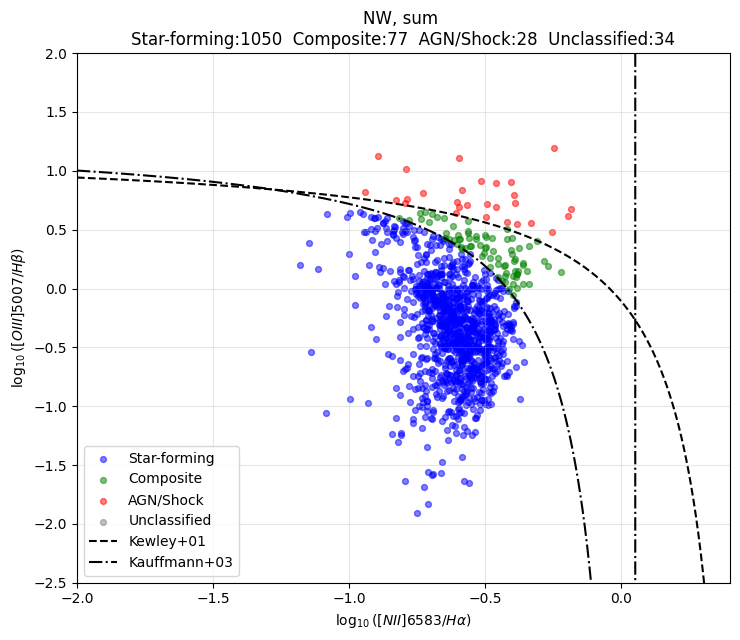

In [20]:
# Compute BPT points

prefix = 'sum'
x_raw, y_raw = merged_df[f'log_NII_Ha_{prefix}_dered'].to_numpy(dtype=float), merged_df[f'log_OIII_Hb_{prefix}_dered'].to_numpy(dtype=float)
# x_bg,  y_bg  = bpt_xy(merged_df, use_bgsub=True)

# Demarcation curves (classic BPT)
x_curve = np.linspace(-2.0, 0.6, 600)
kewley = 0.61 / (x_curve - 0.47) + 1.19      # Kewley+2001
kauff  = 0.61 / (x_curve - 0.05) + 1.30      # Kauffmann+2003

# ---- Plot: overlay raw vs corrected in one figure ----
plt.figure(figsize=(7.5, 6.5))

classes = ["Star-forming", "Composite", "AGN/Shock", "Unclassified"]
colors = ['blue', 'green', 'red', 'grey']
for cls in classes:
    mask = (merged_df[f'BPT_class_{prefix}_dered'] == cls)
    plt.scatter(x_raw[mask], y_raw[mask], s=18, alpha=0.5, label=cls, color=colors[classes.index(cls)])
# #color by BPT class
# plt.scatter(x_raw[merged_df['raw_BPT_class'] == 'star-forming'], 
#             y_raw[merged_df['raw_BPT_class'] == 'star-forming'], s=18, alpha=0.5, label="Star-forming")
# # plt.scatter(x_bg,  y_bg,  s=18, alpha=0.5, label="Background-subtracted (edge threshold)")

plt.plot(x_curve, kewley, linestyle="--", label="Kewley+01", color = 'k')
plt.plot(x_curve, kauff,  linestyle="-.", label="Kauffmann+03", color = 'k')

plt.xlabel(r'$\log_{10}([NII]6583 / H\alpha)$')
plt.ylabel(r'$\log_{10}([OIII]5007 / H\beta)$')
plt.title(f"{field}, {prefix} \nStar-forming:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Star-forming'])}  Composite:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Composite'])}  AGN/Shock:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'AGN/Shock'])}  Unclassified:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Unclassified'])}")

plt.xlim(-2, 0.4)
plt.ylim(-2.5, 2)
plt.grid(alpha=0.3)
plt.legend(frameon=True)
plt.tight_layout()
plt.savefig(os.path.join(figure_dir, f"BPT_{field}_{prefix}.png"), dpi=150)
plt.show()

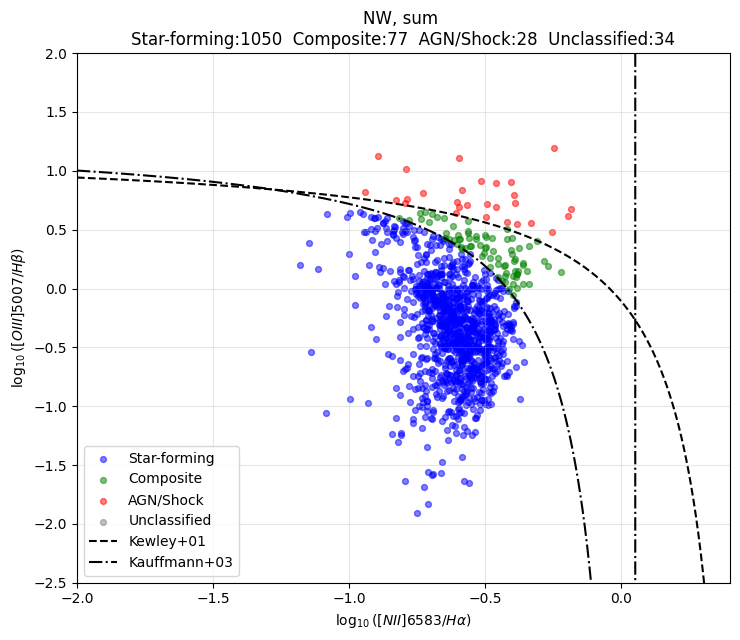

In [21]:
# Compute BPT points

prefix = 'sum'
x_raw, y_raw = merged_df[f'log_NII_Ha_{prefix}_dered'].to_numpy(dtype=float), merged_df[f'log_OIII_Hb_{prefix}_dered'].to_numpy(dtype=float)
# x_bg,  y_bg  = bpt_xy(merged_df, use_bgsub=True)

# Demarcation curves (classic BPT)
x_curve = np.linspace(-2.0, 0.6, 600)
kewley = 0.61 / (x_curve - 0.47) + 1.19      # Kewley+2001
kauff  = 0.61 / (x_curve - 0.05) + 1.30      # Kauffmann+2003

# ---- Plot: overlay raw vs corrected in one figure ----
plt.figure(figsize=(7.5, 6.5))

classes = ["Star-forming", "Composite", "AGN/Shock", "Unclassified"]
colors = ['blue', 'green', 'red', 'grey']
for cls in classes:
    mask = (merged_df[f'BPT_class_{prefix}_dered'] == cls)
    plt.scatter(x_raw[mask], y_raw[mask], s=18, alpha=0.5, label=cls, color=colors[classes.index(cls)])
# #color by BPT class
# plt.scatter(x_raw[merged_df['raw_BPT_class'] == 'star-forming'], 
#             y_raw[merged_df['raw_BPT_class'] == 'star-forming'], s=18, alpha=0.5, label="Star-forming")
# # plt.scatter(x_bg,  y_bg,  s=18, alpha=0.5, label="Background-subtracted (edge threshold)")

plt.plot(x_curve, kewley, linestyle="--", label="Kewley+01", color = 'k')
plt.plot(x_curve, kauff,  linestyle="-.", label="Kauffmann+03", color = 'k')

plt.xlabel(r'$\log_{10}([NII]6583 / H\alpha)$')
plt.ylabel(r'$\log_{10}([OIII]5007 / H\beta)$')
plt.title(f"{field}, {prefix} \nStar-forming:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Star-forming'])}  Composite:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Composite'])}  AGN/Shock:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'AGN/Shock'])}  Unclassified:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Unclassified'])}")

plt.xlim(-2, 0.4)
plt.ylim(-2.5, 2)
plt.grid(alpha=0.3)
plt.legend(frameon=True)
plt.tight_layout()
plt.savefig(os.path.join(figure_dir, f"BPT_{field}_{prefix}.png"), dpi=150)
plt.show()

In [22]:
def plot_field_overlay_halpha_peaks_zoi_boundaries(
    catalog_df,
    ha_fits_path,
    zoi_label_map,
    boundary_label_map,
    field_name=None,
    x_col="x",
    y_col="y",
    region_label_col="zoi_center_label",
    region_id_col="region_id",
    xlim=None,
    ylim=None,
    show_peaks=True,
    show_zoi=True,
    show_boundaries=True,
    peaks_kwargs=None,
    zoi_color="cyan",
    boundary_color="magenta",
    zoi_lw=0.8,
    boundary_lw=1.1,
    alpha_zoi=0.65,
    alpha_boundary=0.9,
    # NEW: LogNorm controls
    ha_percentiles=(5, 99),         # global vmin/vmax percentiles (positive pixels only)
    use_local_lognorm=False,        # if True and xlim/ylim provided -> compute per-view norm
    local_percentiles=(3.0, 99.7),  # per-view percentiles (positive pixels only)
    min_pos_pixels=20,              # minimum positive pixels required to trust local percentiles
    eps_pos=None,                   # epsilon floor for vmin (defaults to nextafter(0,1))
    savepath=None,
    line = 'Halpha'
):
    """
    Overplot peaks + ZOI outlines + boundary outlines on the Halpha map, using LogNorm scaling.

    Parameters
    ----------
    catalog_df : pandas.DataFrame
        Must include x_col/y_col; should include region_label_col (integer ZOI label at center).
    ha_fits_path : str
        Path to Halpha FITS.
    zoi_label_map : 2D array
        Integer-labeled ZOI map (0 outside).
    boundary_label_map : 2D array
        Integer-labeled boundary map (0 outside).
    field_name : str
        Optional display name.
    xlim, ylim : (min,max) or None
        Plot limits in pixel coordinates.
    ha_percentiles : (lo, hi)
        Percentiles used for global LogNorm vmin/vmax (positive finite pixels only).
    use_local_lognorm : bool
        If True and xlim/ylim are given, compute per-view LogNorm using local_percentiles,
        falling back to global if too few positive pixels.
    """

    import numpy as np
    import matplotlib.pyplot as plt
    from astropy.io import fits
    from matplotlib.colors import LogNorm

    # Lazy import so this cell works even if skimage isn't installed elsewhere
    try:
        from skimage.segmentation import find_boundaries  # noqa: F401  (kept as in your original)
    except Exception as e:
        raise ImportError(
            "This plotting function requires scikit-image. "
            "Install with: pip install scikit-image"
        ) from e

    if eps_pos is None:
        eps_pos = np.nextafter(0, 1)

    # --- Field name ---
    if field_name is None:
        field_name = (
            str(catalog_df.get("field", ["Field"]).iloc[0])
            if hasattr(catalog_df, "iloc")
            else "Field"
        )

    # --- Load Halpha map ---
    ha = fits.getdata(ha_fits_path)
    ha = np.where(np.isfinite(ha), ha, np.nan)

    # --- Compute GLOBAL LogNorm vmin/vmax from positive finite pixels ---
    valid_pos = ha[np.isfinite(ha) & (ha > 0)]
    if valid_pos.size == 0:
        raise ValueError("Hα map has no positive finite values for LogNorm.")

    vmin_global = np.nanpercentile(valid_pos, ha_percentiles[0])
    vmax_global = np.nanpercentile(valid_pos, ha_percentiles[1])

    # Fallback if percentiles are degenerate
    if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
        vmin_global, vmax_global = np.nanmin(valid_pos), np.nanmax(valid_pos)
        if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
            raise ValueError("Failed to compute valid global vmin/vmax for Hα.")

    vmin_global = max(vmin_global, eps_pos)

    def _local_lognorm(arr2d):
        """Compute a per-view LogNorm using positive finite pixels, fallback to global."""
        pos = arr2d[np.isfinite(arr2d) & (arr2d > 0)]
        vmin_loc, vmax_loc = vmin_global, vmax_global

        if pos.size >= min_pos_pixels:
            lo = np.nanpercentile(pos, local_percentiles[0])
            hi = np.nanpercentile(pos, local_percentiles[1])
            if np.isfinite(lo) and np.isfinite(hi) and hi > lo:
                vmin_loc, vmax_loc = lo, hi

        vmin_loc = max(vmin_loc, eps_pos)
        if (not np.isfinite(vmax_loc)) or (vmax_loc <= vmin_loc):
            vmax_loc = vmin_loc * 1.01
        return LogNorm(vmin=vmin_loc, vmax=vmax_loc)

    # Decide norm: global or local-per-view
    norm = LogNorm(vmin=vmin_global, vmax=vmax_global)
    if use_local_lognorm and (xlim is not None) and (ylim is not None):
        # Clip indices safely and compute norm on that view
        x0, x1 = sorted([int(np.floor(xlim[0])), int(np.ceil(xlim[1]))])
        y0, y1 = sorted([int(np.floor(ylim[0])), int(np.ceil(ylim[1]))])
        x0 = max(0, x0); y0 = max(0, y0)
        x1 = min(ha.shape[1], x1); y1 = min(ha.shape[0], y1)
        view = ha[y0:y1, x0:x1]
        if view.size > 0:
            norm = _local_lognorm(view)

    # --- Ensure integer maps ---
    zoi_int = np.rint(np.nan_to_num(zoi_label_map, nan=0)).astype(np.int32)
    bnd_int = np.rint(np.nan_to_num(boundary_label_map, nan=0)).astype(np.int32)

    # --- Figure ---
    fig, ax = plt.subplots(figsize=(10, 10 * ha.shape[0] / ha.shape[1]))

    # Make NaNs white
    cmap_gray = plt.get_cmap("gray").copy()
    cmap_gray.set_bad(color="white")

    # IMPORTANT CHANGE: show ha (linear) with LogNorm (not log10(ha))
    im = ax.imshow(ha, origin="lower", cmap=cmap_gray, norm=norm)

    # --- Overlay outlines ---
    labels_from_catalog = None
    if hasattr(catalog_df, "columns") and (region_label_col in catalog_df.columns):
        labels_from_catalog = sorted({
            int(v) for v in catalog_df[region_label_col].values
            if np.isfinite(v) and int(v) > 0
        })

    if labels_from_catalog and len(labels_from_catalog) > 0:
        labels = labels_from_catalog
    else:
        labels = sorted([int(v) for v in np.unique(bnd_int) if v > 0])

    # NOTE: your original code contours the entire label maps at 0.5, which is fine.
    if show_zoi and np.isfinite(zoi_int).any():
        edge = np.nan_to_num(zoi_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[zoi_color], linewidths=zoi_lw,
                   origin="lower", zorder=1, alpha=alpha_zoi)
    if show_boundaries and np.isfinite(bnd_int).any():
        edge = np.nan_to_num(bnd_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[boundary_color], linewidths=boundary_lw,
                   origin="lower", zorder=1, alpha=alpha_boundary)

    # --- Plot peak centers ---
    if show_peaks:
        if peaks_kwargs is None:
            peaks_kwargs = dict(marker="+", s=18, linewidths=0.8, alpha=0.85)
        xs = catalog_df[x_col].astype(float).values
        ys = catalog_df[y_col].astype(float).values
        ax.scatter(xs, ys, color="k", **peaks_kwargs, label="Peaks")

    # --- Colorbar ---
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"Flux (LogNorm)")

    # --- Aesthetics ---
    ax.set_title(f"{line} with Peaks, ZOI (cyan), Boundaries (magenta)")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_facecolor("white")
    fig.patch.set_facecolor("white")

    # Limits
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)

    if show_peaks:
        ax.legend(loc="upper right", frameon=True)

    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, bbox_inches="tight", dpi=300, facecolor="white")
        print(f"[done] Saved overlay plot: {savepath}")

    plt.show()
    plt.close(fig)
    return fig, ax

Creating overlay plot for ha with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_ha_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_ha_overlay.png


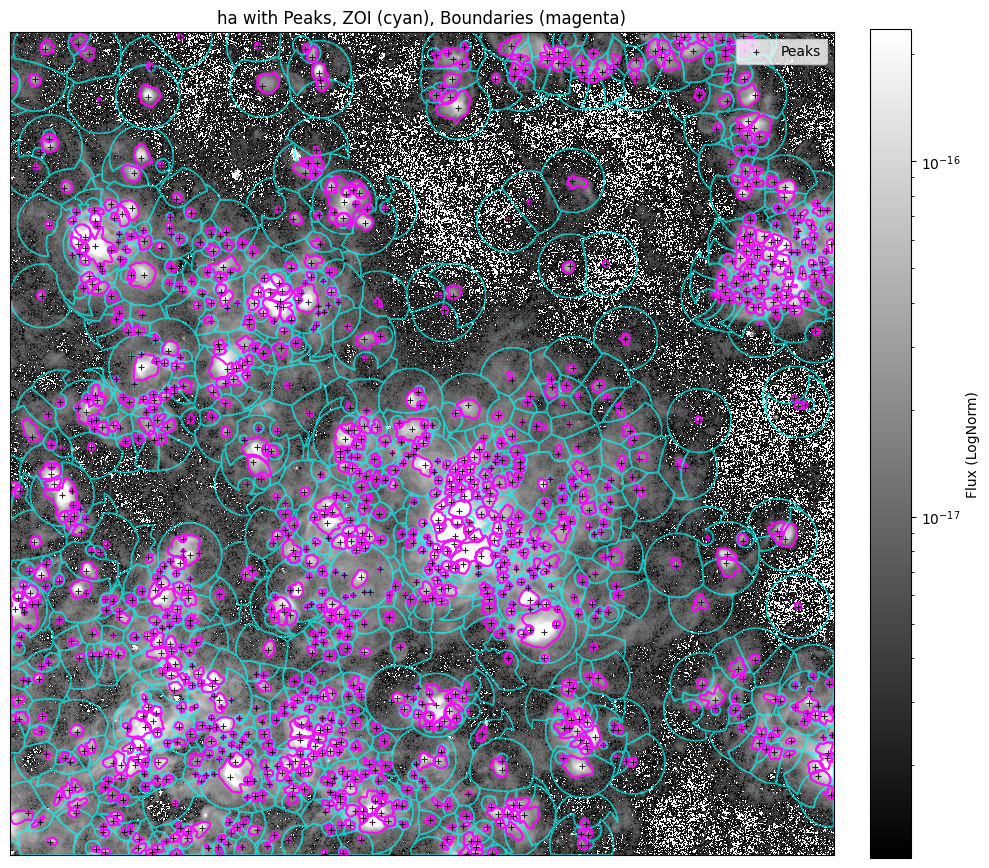

Creating overlay plot for hb with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_hb_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_hb_overlay.png


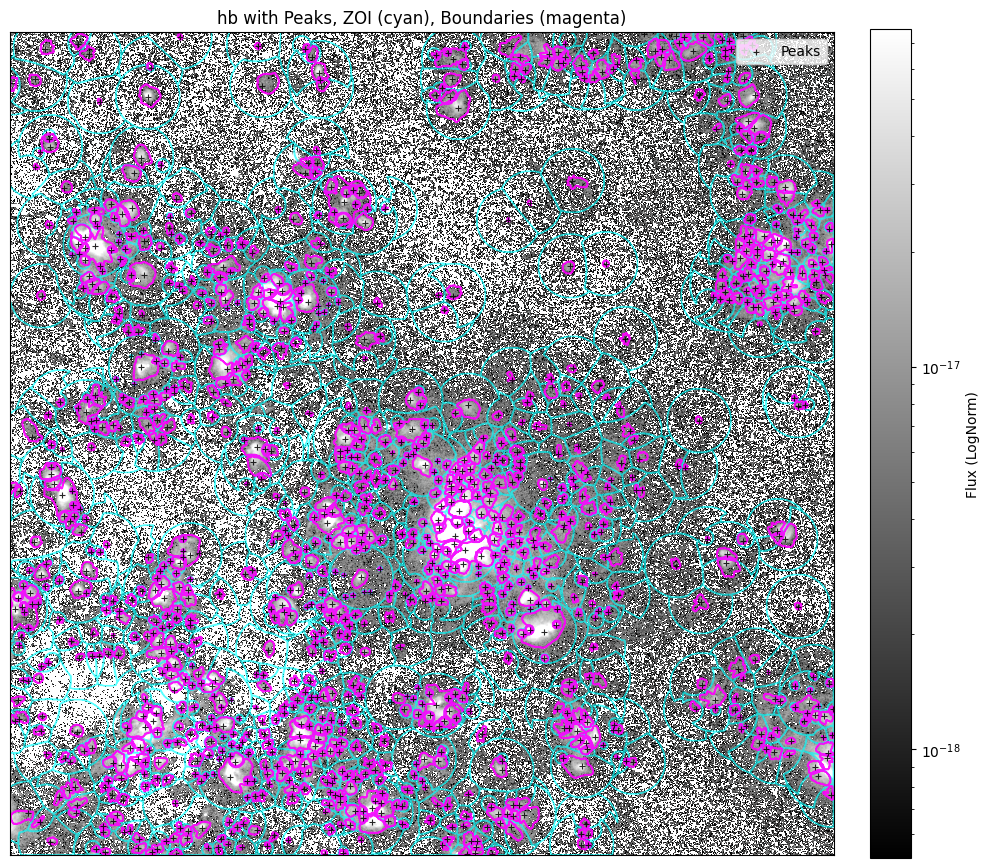

Creating overlay plot for oiii5007 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_oiii5007_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_oiii5007_overlay.png


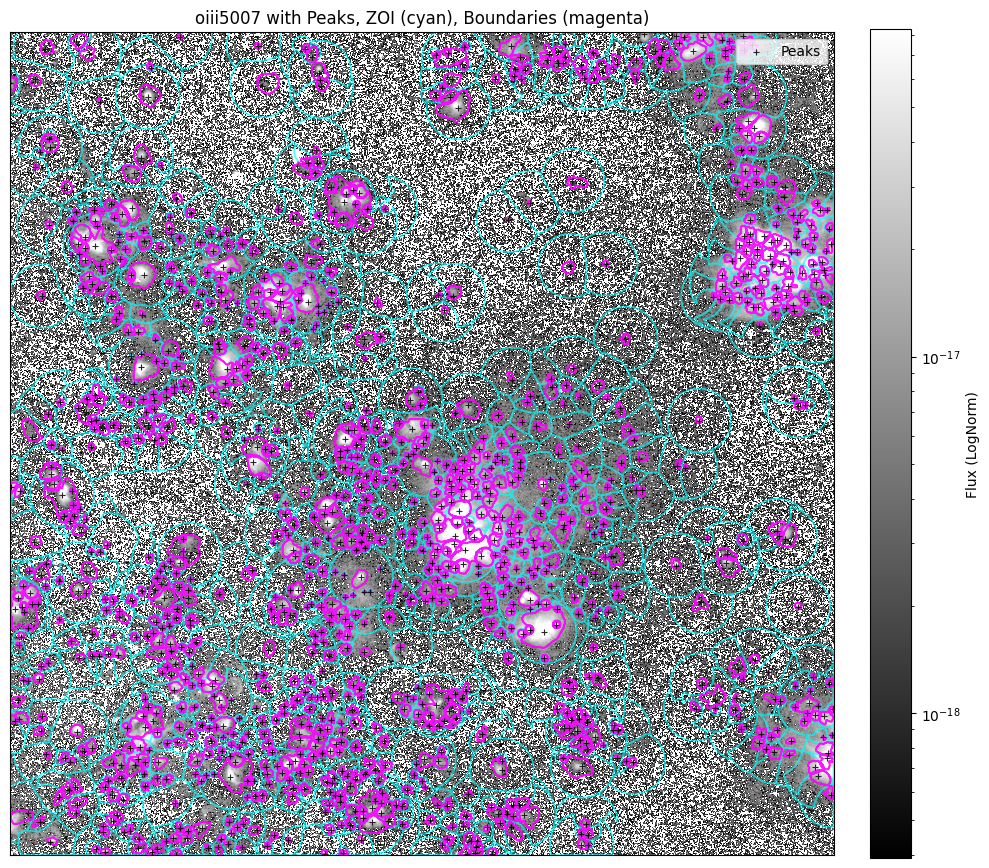

Creating overlay plot for sii6716 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_sii6716_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_sii6716_overlay.png


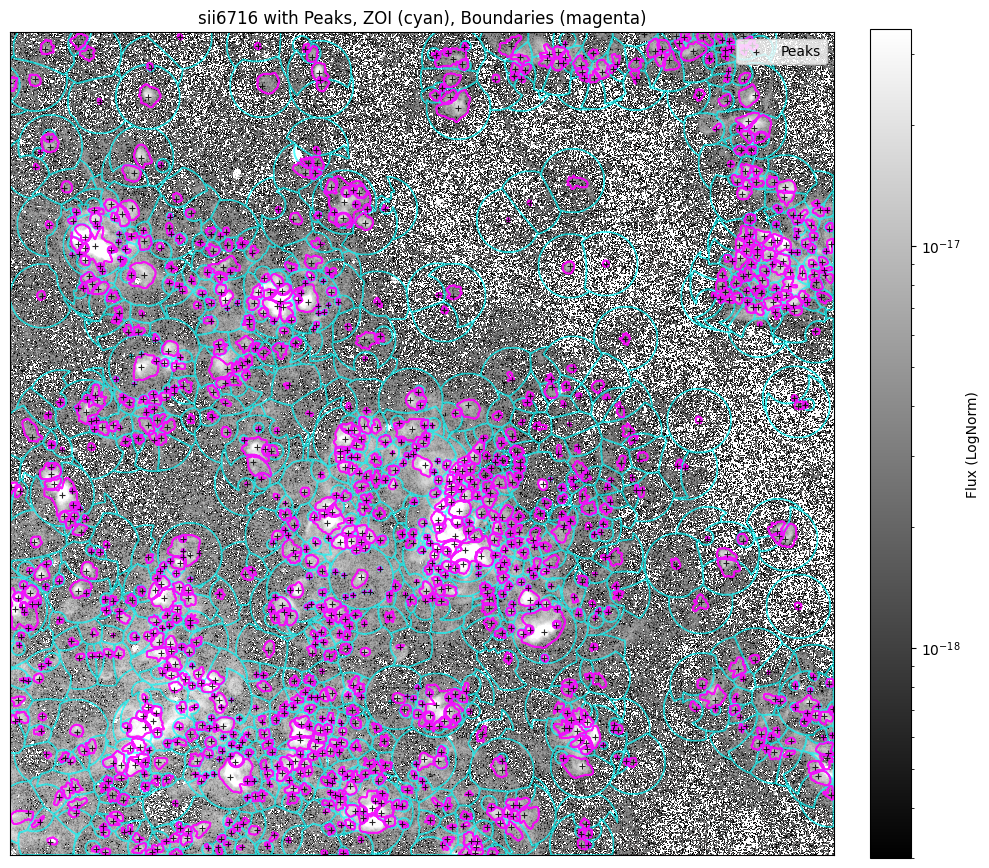

Creating overlay plot for sii6731 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_sii6731_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_sii6731_overlay.png


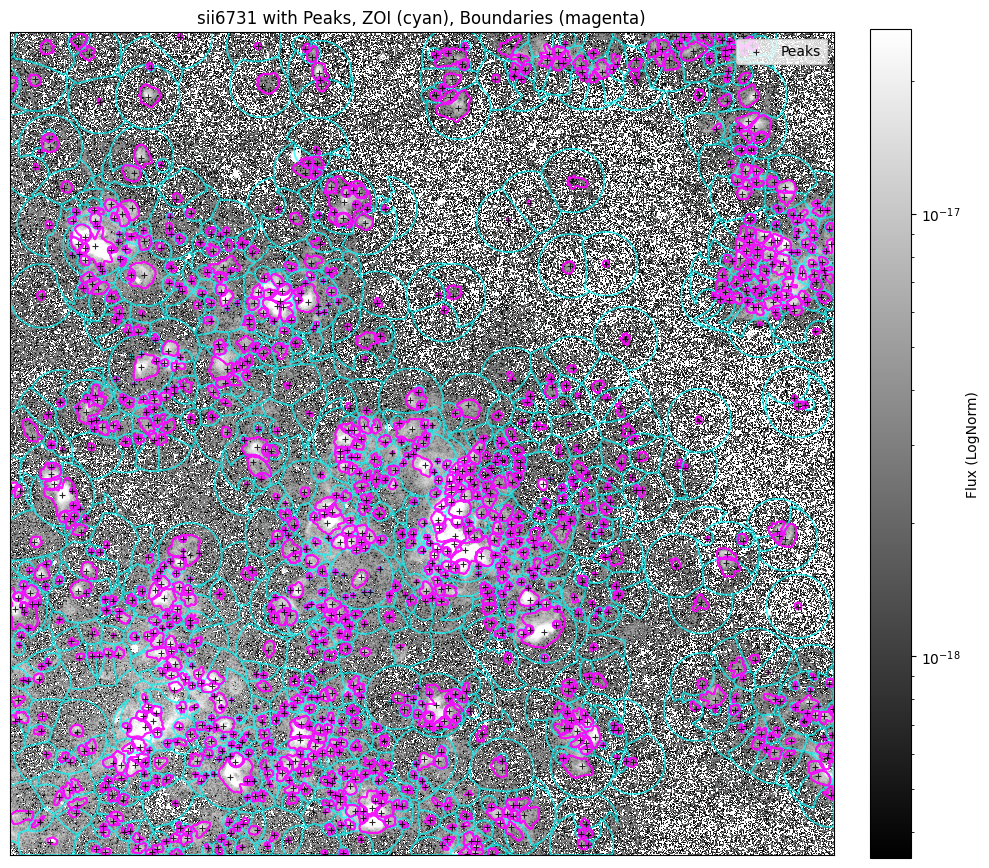

Creating overlay plot for nii6584 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_nii6584_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_nii6584_overlay.png


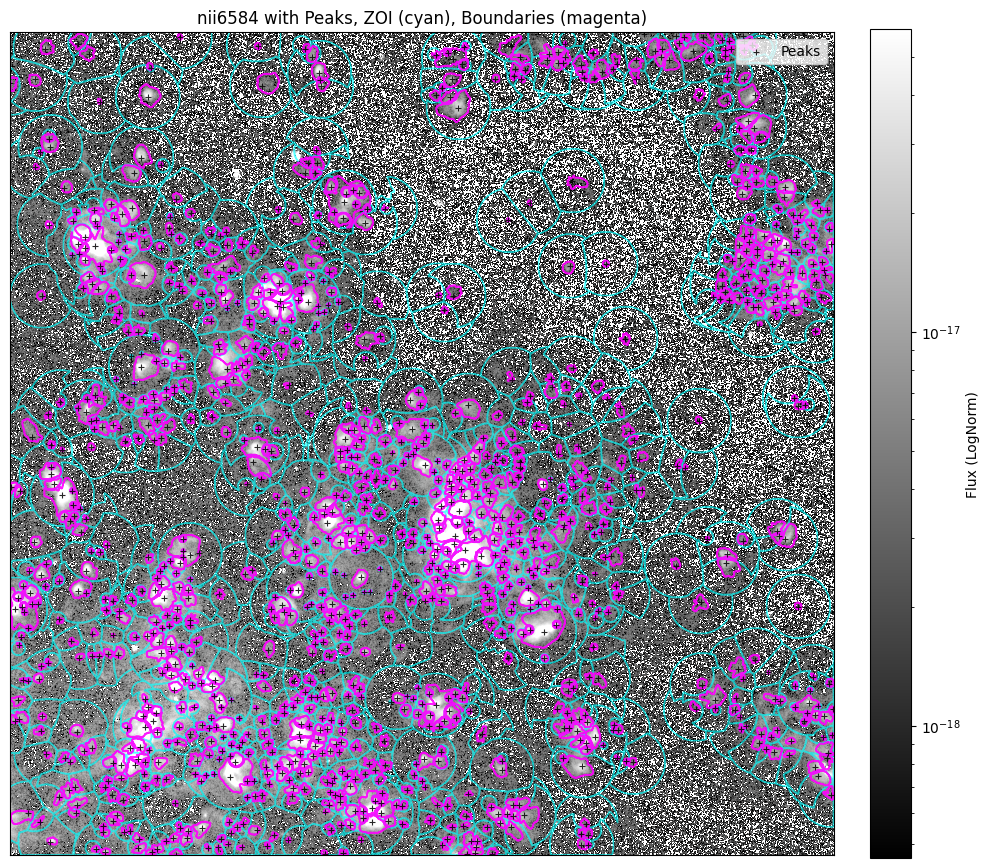

Creating overlay plot for oii3727 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NW/M33_NW_oii3727_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NW/M33_NW_oii3727_overlay.png


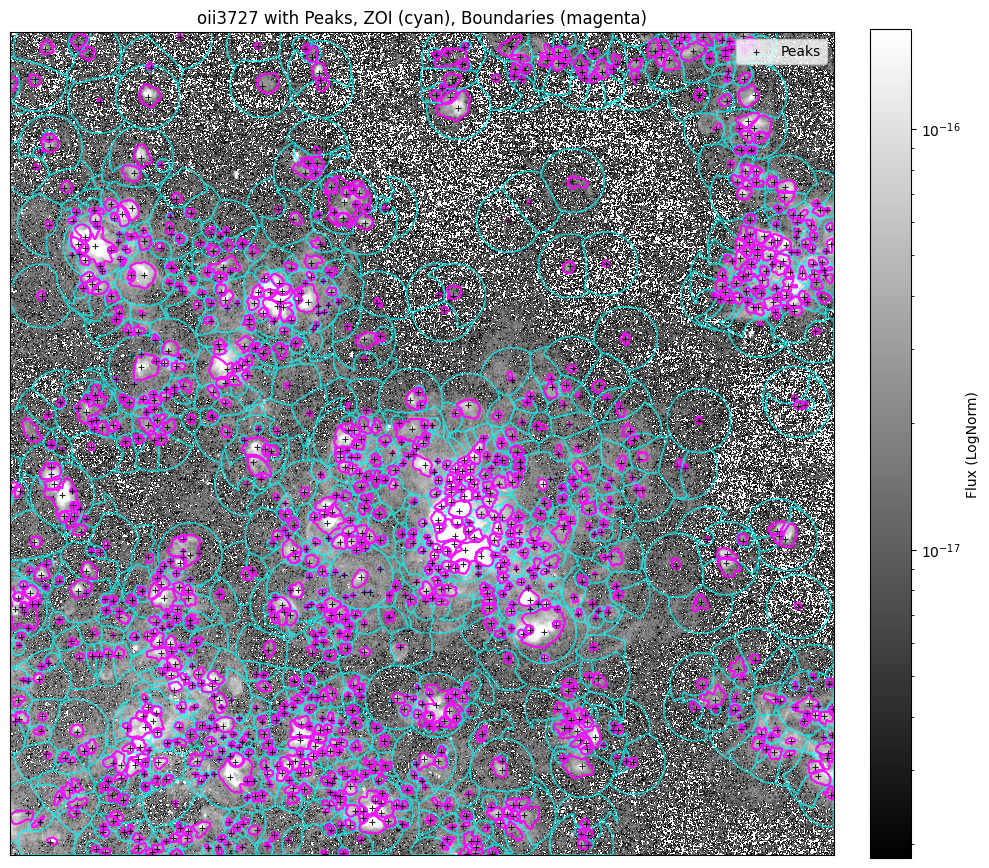

In [23]:
"""
Runs the full-field overlay plot using the variables created earlier in the notebook.
"""
# Example usage (matches your earlier variables):
# - combined: your peak catalog dataframe
# - halpha_fits: Halpha FITS path
# - zoi_label: ZOI label map (2D)
# - boundary_label: final boundary label map (2D)

# Optional: zoom limits (set to None to show full frame)
xlim = (50, 2000)
ylim = (50, 2000)

contzoi_fits = f"ZOI_maps/ZOI_map_{max_zoi}pc/ContZoI_map_{field}.fits"
contzoi_label = fits.getdata(contzoi_fits)
cont_map_fits = f"Boundary_maps/Boundary_map_100pc/ContDomain_map_{field}.fits"
cont_map = fits.getdata(cont_map_fits)

plot_maps_dir = f"plots/individual_field_flux_plots/{field}"
os.makedirs(plot_maps_dir, exist_ok=True)
folder = f"../M33-Maps-Calibrated/M33-{field}/"
for line in ["ha", "hb", "oiii5007", "sii6716", "sii6731", "nii6584", "oii3727"]:
    line_fits = f"{folder}M33{field}-{line}flux.fits"
    line_data = fits.getdata(line_fits)
    line_data = np.where(np.isfinite(line_data), line_data, np.nan)
    plot_overlay_path = f"{plot_maps_dir}/M33_{field}_{line}_overlay.png"
    print(f"Creating overlay plot for {line} with peaks, ZOI, and boundaries; saving to: {plot_overlay_path}")
    plot_field_overlay_halpha_peaks_zoi_boundaries(
        catalog_df=merged_df,
        ha_fits_path=line_fits,
        zoi_label_map=contzoi_label,
        boundary_label_map=cont_map,
        field_name=f"M33 {field}",
        x_col="x",
        y_col="y",
        region_label_col="zoi_center_label",
        xlim=xlim,
        ylim=ylim,
        show_peaks=True,
        show_zoi=True,
        show_boundaries=True,
        savepath=plot_overlay_path,
        line = line
    )